## **Studies in Shakespeare**





### **Section 1: Dataset**

The dataset chosen was a Shakespeare dataset of all his known and collected plays; hosted on Kaggle at: https://www.kaggle.com/datasets/kingburrito666/shakespeare-plays?select=Shakespeare_data.csv.

<br> It is comprised of 6 columns regarding the metadata and textual contents of his plays, namely; <br>

**Column 1:** ***data-line***, counts the current row in the dataset. <br>
**Column 2:** ***play***, the name of the play of which the dialogue is from. <br>
**Column 3**: ***PlayerLinenumber***, the actual line number from which the current dialogue is getting spoken from. <br>
**Column 4**: ***ActSceneLine***, the act-scene-line of which the current line of dialogue is from. <br>
**Column 5:** ***Player***, the name of the player whom is speaking the current line. <br>
**Column 6:** ***PlayerLine***, the actual text of the line being spoken. <br>

The task to be performed is the loading, exploration and pre-processsing of the dataset for the **goal of generating shakespeare-like text** via natural language generation for both entertainment and to perform a comparative evaluation of 2 ML models to evaluate the performance and effectivity in generating short but sweat Shakespeare-like dialogue.

This task is mainly just for entertainment purposes, generating and reading the shakespeare-like text would be a novel way of passing the time.

In [ ]:
# Initializing project dependencies
import pandas as pd # for utilising pandas data frames
import numpy as np # for working with numpy dictonaries, far superior than the built-in Python3 functionality
import sklearn # for training and testing the nlg models
from collections import defaultdict, Counter # for better dictonary access
import nltk # natural language tool-kit, models for working with language
import re # regular expression module, helps curate text expressions
from nltk import ngrams # for implementing a ngrams based nlg model approach
from transformers import pipeline # for use in the transformer NLG model approach.
import random # for determing and evalauting NLG models.
import time # for use in calculating Model(s) runtime time cost.
import matplotlib.pyplot as plt # for creating evaluative visualisations, including charts and graphs in eventual model evalaution stage.
from gensim.models import Word2Vec # for creating vector embeddings based on the PlayerLine tokenised/and pre-processed dialogue
from collections import Counter # for use in calculating most frequently used words in the plays dataset

# ntlk imports
from nltk.stem.snowball import SnowballStemmer # for use in stemming the cleaned up PlayerLine column, in the road to eventual effective vectorisation
from nltk.translate.bleu_score import sentence_bleu # for measuring the bleu score
from nltk.metrics.scores import f_measure # for measuring the f score
from nltk.translate.bleu_score import SmoothingFunction
from nltk.translate.meteor_score import meteor_score

# sklearn imports
from sklearn.manifold import TSNE # for visualising and optimising the word embedding models
from sklearn.model_selection import train_test_split # for creating testing, training splits to evaluate NLG models
from sklearn.feature_extraction.text import TfidfVectorizer # for word vectorisations
from sklearn.model_selection import train_test_split # for creating testing and training data sets by splitting from the parent source

# memory profiling, for evaulation
!pip install memory_profiler # for evaluating NLG models memory usage.
from memory_profiler import memory_usage # method to get the memory_usage of a NLG model

import kagglehub # for retrieving the shakespeare dataset via kaggle
import os # for creating files and temporary files

# Representation Learning word vector models requires the use of pip to add it to my juypter enviroment
!pip install fasttext # fasttext model
!pip install glove-python3 # GloVE mode
!pip install rouge-score # for performing and getting the ROUGE score for the NLG models created

# Import the above pip installed modules
import fasttext # for the fast text word embedding model
from glove import Corpus, Glove # for the GloVE word embedding model

# NLG score(s), for use in evaluation
from rouge_score import rouge_scorer # scores the rouge score
from nltk.translate.meteor_score import meteor_score # calculates the meteor score

# for outputting the evaluative model metrics more prettily, makes presenting dictionary objects far easier than vanilla python
import pprint
import warnings # to hide BLEU Score output warnings, more on this in the evaluation section

# downloads for nltk, for stemming, removing unwanted stopwords, word tokenisation and other pre-processing techniques.
nltk.download('wordnet')
nltk.download('punkt')
nltk.download('punkt_tab')
nltk.download('omw-1.4')
nltk.download('stopwords')

[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package punkt_tab to /root/nltk_data...
[nltk_data]   Package punkt_tab is already up-to-date!
[nltk_data] Downloading package omw-1.4 to /root/nltk_data...
[nltk_data]   Package omw-1.4 is already up-to-date!
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

In [ ]:
# Loading and retrieving the Shakespeare Dataset from Kaggle

# Download latest version of the Shakespeare plays dataset using the kagglehub module for downloading the kaggle hosted shakespeare dataset programmatically without using a dodgy data-scraping approach.
path = kagglehub.dataset_download("kingburrito666/shakespeare-plays")

# debug to show path to the dataset on the google colab file server, allows for the retrieval by the outputted path.
print("Path to dataset files:", path) # we see the local google colab directory housing the retrieved shakespeare dataset in the 4 directory.

Path to dataset files: /root/.cache/kagglehub/datasets/kingburrito666/shakespeare-plays/versions/4


In [ ]:
# Retrieving the shakespeare plays dataset and casting it to a Panda DataFrame

# Retrieving the plays csv file
plays =  path + "/Shakespeare_data.csv" # retrieve the plays dataset with the collected dialogue of one William Shakesprea.

# Convert the Plays.csv file into a panda data frame object
plays = pd.read_csv(plays)

# Confirm that plays is now a Pandas dataFrame, instead of a csv file it was before conversion.
print(type(plays))

<class 'pandas.core.frame.DataFrame'>


In [ ]:
# Get the total bytes consumed by the elements of the DataFrame
size_initial = plays.memory_usage(index=True, deep=True).sum()

# Convert size from bytes to megabytes
size_initial = size_initial / (1024 * 1024)

# Output and round to 0 dp
print('Size of our target plays dataFrame in it\'s original form:')
print(round(size_initial, 0), 'MB')

Size of our target plays dataFrame in it's original form:
33.0 MB


In [ ]:
# Save the original state of the play dataset to a local csv file, to ensure that we can still work with it despite a kaggle issue
plays.to_csv('original_plays_state.csv', index=False) # dataline is an index anyway

In [ ]:
# Some common-place data exploration methods, used to showcase the 'plays' dataframe
print(plays.info()) ; print('\n') # column type info
print(plays.describe()); print('\n') # some helpful stats on the data, (count, mean, standard deviation, min, max etc..)
print(plays.head()) ; print('\n') # outputs first 5 entries in the plays dataset
print(plays.tail()) ; print('\n') # outputs the last 5 entries in the plays dataset

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 111396 entries, 0 to 111395
Data columns (total 6 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   Dataline          111396 non-null  int64  
 1   Play              111396 non-null  object 
 2   PlayerLinenumber  111393 non-null  float64
 3   ActSceneLine      105153 non-null  object 
 4   Player            111389 non-null  object 
 5   PlayerLine        111396 non-null  object 
dtypes: float64(1), int64(1), object(4)
memory usage: 5.1+ MB
None


            Dataline  PlayerLinenumber
count  111396.000000     111393.000000
mean    55698.500000         36.885334
std     32157.399631         39.985840
min         1.000000          1.000000
25%     27849.750000         10.000000
50%     55698.500000         25.000000
75%     83547.250000         50.000000
max    111396.000000        405.000000


   Dataline      Play  PlayerLinenumber ActSceneLine         Player  \
0         1  

In [ ]:
# Get size of plays
plays.shape # 6 features, 111396 rows of data.

(111396, 6)

In [ ]:
# get initial count of PlayerLine, for use later in determing how many rows we will end up removing (PlayerLine(s) containing stage directions)
original_size = plays['PlayerLine'].count()

# output the size of the data, aka how many rows of data there is.
#print(original_size) # 111396

# we could also just use plays.shape and get the x value (rows) of the plays pandas DataFrame
original_size = plays.shape[0]
print(original_size) # 111396

111396


In [ ]:
# Let's show the features of our kaggle retrieved shakespeare compelete dialogue dataset
plays.columns # get column names

Index(['Dataline', 'Play', 'PlayerLinenumber', 'ActSceneLine', 'Player',
       'PlayerLine'],
      dtype='object')

In [ ]:
print(len(plays.columns)) # get number of columns

6


In [ ]:
# get total size (rows x columns) of the plays data frame
print(plays.size)

668376


In [ ]:
# get number of unique entries in each column
plays.nunique()

,0
Dataline,111396
Play,36
PlayerLinenumber,405
ActSceneLine,16122
Player,934
PlayerLine,107580


In [ ]:
# Check for missing data in the play dataFrame
plays.isnull().sum() # 3 in PlayerLinenumber, 6243 in ActSceneLine and 7 in Player

# However, for just generating Shakespeare text without additional context, we only need the actual PlayerLine text data as it the actual data of the shakespeare text including as of this moment metadata such as stage directions and act headers.
# Thus we can drop the others, as adding in additional context will only increase the stress on the already dodgy Google Colab runtime, therefore we will be reducing the scope to ensure Colab has the resources avaliable to actually run and show the evidence of each code block.

,0
Dataline,0
Play,0
PlayerLinenumber,3
ActSceneLine,6243
Player,7
PlayerLine,0


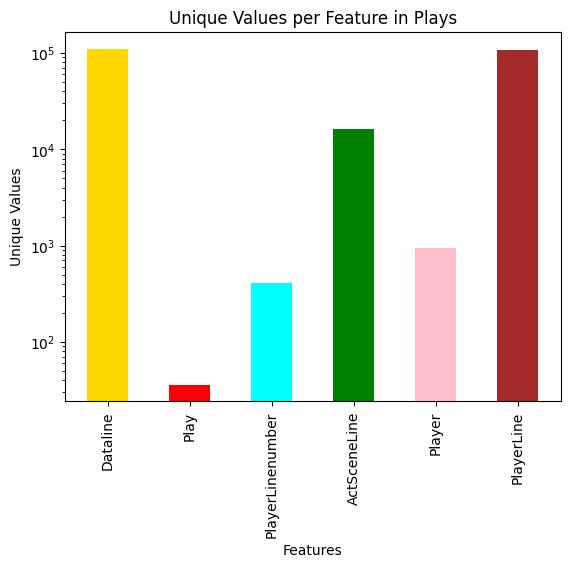

In [ ]:
# get count of each unique feature and visualise it as a logarithmic bar plot

# create a empty array to store the enumeration of each features unique count
feature_count = []

# loop thorugh each feature
for column in plays.columns:
  # get the unique count for each feature (from Dataline to PlayerLine)
  feature_count.append(len(plays[column].unique()))

# bar plot each feature's unique data
feature_names = plays.columns # get the column names as to use as x axis label

plt.bar(feature_names, feature_count, width=0.5, color=['gold', 'red', 'cyan', 'green', 'pink', 'brown']) # let the bar plot use our feature names as x axis, and unique feature count as y axis
plt.xlabel('Features') # x axis label
plt.xticks(rotation=90) # so x labels don't overlap
plt.ylabel('Unique Values') # y axis label
plt.yscale('log') # use log scale for y
plt.title('Unique Values per Feature in Plays') # give the bar plot as a title

plt.show() # output the unique entires feature count

In [ ]:
# Start of Pre-processing the Dataset

# remove all columns bar the PlayerLine, as PlayerLine contains the actual data rather than the other columns metadata
plays = plays.drop(['Dataline', 'Play', 'PlayerLinenumber', 'ActSceneLine', 'Player'], axis=1)

# Confirm column dropping worked
plays

,PlayerLine
0,ACT I
1,SCENE I. London. The palace.
2,"Enter KING HENRY, LORD JOHN OF LANCASTER, the ..."
3,"So shaken as we are, so wan with care,"
4,"Find we a time for frighted peace to pant,"
...,...
111391,"Lead us from hence, where we may leisurely"
111392,Each one demand an answer to his part
111393,Perform'd in this wide gap of time since first
111394,We were dissever'd: hastily lead away.


In [ ]:
# further confirm the columns in the dataset after removal
plays.columns

Index(['PlayerLine'], dtype='object')

In [ ]:
print(len(plays.columns)) # get number of columns, should be 1 as we have dropped the others as they are not needed in the grand scheme of my project

1


In [ ]:
# Removal of Stage Directions (Will take a while to run...)

# Stage Directions can in this context be considered metadata and is not needed to generate shakespearian dialogue, as we only need the textual data from what the players are actually saying rather than Shakespeare himself giving the stage directions.

# A list of stage_directions that Shakespeare used, created by directly removing the stage directions as defined but not implemented by shakespeareswords.com, some stage directions may not be picked up and could possibly be used in generation.
stage_directions = ["ACT", "SCENE", "LINE", "Enter", "aside", "above", "aloft", "aloof", "apart", "aside", "below", "break in", "brought out", "enter", "exeunt", "exit", "in", "manent", "off", "severally. several ways", "top, on the", "within", "alarum, alarums", "excursions", "excursion, in an", "cornet", "drum", "flourish", "hautboys", "sennet", "trump, trumpet", "tucket"]

# Iterate through each line of Shakespearan dialogue (for each in plays)
for index, row in plays.iterrows():
  # if PlayerLine starts with a stage direction defined in stage_directions, drop the PlayerLine as it is a stage direction and not a shakespear characters dialogue. Or if line contains an upper case of the first word of the stage directions?
  if row['PlayerLine'].startswith(tuple(stage_directions)) or row['PlayerLine'].startswith(tuple(direction.capitalize() for direction in stage_directions)):
    # remove the stage direction
    plays.drop(index, inplace=True)

  # if not skip the current PlayerLine as there is no stage directions found to be removed.
  else:
    # move on to next word, will jump to the the reset command below if last word in the dialogue
    continue

# reset the index of plays, after rows have been removed
plays.reset_index(drop=True, inplace=True)

# get new size of PlayerLine column
new_size = plays['PlayerLine'].count()

# calculate the number of rows we just removed by taking the original size and taking away from the new size.
diff_in_size = int(original_size - new_size)
print(diff_in_size) # output the number of rows we just removed, should be ~6400 tokens removed, this will allow for the text generation to be more accurate as there is less un-wanted data, (stage directions) that could potentially be generated with the real data we want (the PlayerLine dialogue)

6406


In [ ]:
# present the stage direction detection and delection attempt
print(diff_in_size, 'stage directions found and deleted.')

6406 stage directions found and deleted.


In [ ]:
# Let's see the plays dataFrame with the stage directions removed
plays # note that Act, Begins and other stage directions are now removed, and plays has successful reset it's index and now starts with real player dialogue.

,PlayerLine
0,"So shaken as we are, so wan with care,"
1,"Find we a time for frighted peace to pant,"
2,And breathe short-winded accents of new broils
3,To be commenced in strands afar remote.
4,No more the thirsty entrance of this soil
...,...
104985,"Is troth-plight to your daughter. Good Paulina,"
104986,"Lead us from hence, where we may leisurely"
104987,Each one demand an answer to his part
104988,Perform'd in this wide gap of time since first


In [ ]:
# Search for unwanted characters in PlayerLine, so we if there are any unwanted characters that we can remove

punctuation_count = 0  # Initialize a count for any punctuation
extra_spaces_count = 0  # Initialize a count for any found extra spaces in the playerLine column
number_count = 0  # Initialize a count for any numbers

# for each line of dialogue, count for un-wanted characters
for text in plays['PlayerLine']:
    punctuation_count += len(re.findall(r'[^\w\s]', text))  # Count and accumulate for each string
    extra_spaces_count += len(re.findall(r'\s+', text))  # Count and accumulate for each string
    number_count += len(re.findall(r'\d+', text))  # Count and accumulate for each string

# output unwanted character count
print("Number of un-wanted punctuation:" , punctuation_count) # output the occurences of un-wanted punctuation
print("Number of un-wanted extra spacing:" , extra_spaces_count) # output the occurences of un-wanted extra-spacing
print("Number of un-wanted integer literals:" , number_count) # output the occurence of unwanted number characters

# We now know there is unwanted symbols in PlayerLine and we will then take the steps below to drop these unwanted symbols from the PlayerLine column so we can clean the data in order for future tokenization.

Number of un-wanted punctuation: 193102
Number of un-wanted extra spacing: 677618
Number of un-wanted integer literals: 17


In [ ]:
# Create a dictionary to store the unwanted symbols/characters found
unwanted_symbols_count = {
    'punctuation': punctuation_count, # count punctuation symbols
    'extra_spaces': extra_spaces_count, # count unwanted spacing
    'numbers': number_count # count numerical symbols, as we want to output shakespeare text and thus non-numerics
}

# Output the count of unwanted symbols within the PlayerLine feature
print(unwanted_symbols_count)

{'punctuation': 193102, 'extra_spaces': 677618, 'numbers': 17}


In [ ]:
# Pre-process and clean up the PlayerLine text using regex find and remove
def clean_text(text):
    text = re.sub(r'[^\w\s]', '', text).lower()  # remove punctuation and make lowercase
    text = re.sub(r'\s+', ' ', text)  # remove extra spaces
    text = text.strip()  # remove the other spaces, namely leading and trailing spaces
    text = re.sub(r'\d+', '', text)  # remove any numbers

    return text # return the dialogue with some basic text cleaning

In [ ]:
# Create a cleaned dialogue column with my above pre-processing function
plays['Cleaned_Dialogue'] = plays['PlayerLine'].apply(clean_text)  # clean the PlayerLine column using the clean_text ruleset

In [ ]:
# show plays now with the cleaned dialogue feature/column
plays

,PlayerLine,Cleaned_Dialogue
0,"So shaken as we are, so wan with care,",so shaken as we are so wan with care
1,"Find we a time for frighted peace to pant,",find we a time for frighted peace to pant
2,And breathe short-winded accents of new broils,and breathe shortwinded accents of new broils
3,To be commenced in strands afar remote.,to be commenced in strands afar remote
4,No more the thirsty entrance of this soil,no more the thirsty entrance of this soil
...,...,...
104985,"Is troth-plight to your daughter. Good Paulina,",is trothplight to your daughter good paulina
104986,"Lead us from hence, where we may leisurely",lead us from hence where we may leisurely
104987,Each one demand an answer to his part,each one demand an answer to his part
104988,Perform'd in this wide gap of time since first,performd in this wide gap of time since first


In [ ]:
# tokenize the above created Cleaned_text column column into a new column entitled tokens using nltk to tokenize each word in the shakespeare dataFrane.
plays['Tokenised_Dialogue'] = plays['Cleaned_Dialogue'].apply(nltk.word_tokenize) # apply the tokenisation and create a new column to both store and showcase the resultant tokenisation process.

In [ ]:
# output plays now with the added tokenised dialogue feature
plays

,PlayerLine,Cleaned_Dialogue,Tokenised_Dialogue
0,"So shaken as we are, so wan with care,",so shaken as we are so wan with care,"[so, shaken, as, we, are, so, wan, with, care]"
1,"Find we a time for frighted peace to pant,",find we a time for frighted peace to pant,"[find, we, a, time, for, frighted, peace, to, ..."
2,And breathe short-winded accents of new broils,and breathe shortwinded accents of new broils,"[and, breathe, shortwinded, accents, of, new, ..."
3,To be commenced in strands afar remote.,to be commenced in strands afar remote,"[to, be, commenced, in, strands, afar, remote]"
4,No more the thirsty entrance of this soil,no more the thirsty entrance of this soil,"[no, more, the, thirsty, entrance, of, this, s..."
...,...,...,...
104985,"Is troth-plight to your daughter. Good Paulina,",is trothplight to your daughter good paulina,"[is, trothplight, to, your, daughter, good, pa..."
104986,"Lead us from hence, where we may leisurely",lead us from hence where we may leisurely,"[lead, us, from, hence, where, we, may, leisur..."
104987,Each one demand an answer to his part,each one demand an answer to his part,"[each, one, demand, an, answer, to, his, part]"
104988,Perform'd in this wide gap of time since first,performd in this wide gap of time since first,"[performd, in, this, wide, gap, of, time, sinc..."


In [ ]:
# Method to stem each word in the given text (PlayerLine column).
def stemming(text):
  stemmer = nltk.stem.PorterStemmer()  # define the stemmer from the nltk library

  # Iterate through each token in the list and apply stemming.
  stemmed_words = [stemmer.stem(t) for t in text]

  return stemmed_words  # Return the list of stemmed words

# Method to lemmatizate each word in the text carrying on from the stemed dialogue
def lemmatization(text):
  lemmatizer = nltk.stem.WordNetLemmatizer()  # define the lemmatizer

  # Iterate through each stemmed word and apply lemmatization.
  lemmatized_words = [lemmatizer.lemmatize(t) for t in text]

  return lemmatized_words # Return a string of lemmatized words lemmatized words back into a string so that they can be tokenised from

# Create the newly pre-processed features
plays['Stemmed_Dialogue'] = plays['Tokenised_Dialogue'].apply(stemming) # Lemmatize the PlayerLine column
plays['Lemmatized_Dialogue'] = plays['Stemmed_Dialogue'].apply(lemmatization) # Stem the PlayerLine column

In [ ]:
# output the current state of the plays dataframe, complete with the original PlayerLine column, with the hard-coded stage removal Clean_text, the resultant stemming and lemmatization process and finally the most current and ready to vectorise, Tokenized_text
plays

,PlayerLine,Cleaned_Dialogue,Tokenised_Dialogue,Stemmed_Dialogue,Lemmatized_Dialogue
0,"So shaken as we are, so wan with care,",so shaken as we are so wan with care,"[so, shaken, as, we, are, so, wan, with, care]","[so, shaken, as, we, are, so, wan, with, care]","[so, shaken, a, we, are, so, wan, with, care]"
1,"Find we a time for frighted peace to pant,",find we a time for frighted peace to pant,"[find, we, a, time, for, frighted, peace, to, ...","[find, we, a, time, for, fright, peac, to, pant]","[find, we, a, time, for, fright, peac, to, pant]"
2,And breathe short-winded accents of new broils,and breathe shortwinded accents of new broils,"[and, breathe, shortwinded, accents, of, new, ...","[and, breath, shortwind, accent, of, new, broil]","[and, breath, shortwind, accent, of, new, broil]"
3,To be commenced in strands afar remote.,to be commenced in strands afar remote,"[to, be, commenced, in, strands, afar, remote]","[to, be, commenc, in, strand, afar, remot]","[to, be, commenc, in, strand, afar, remot]"
4,No more the thirsty entrance of this soil,no more the thirsty entrance of this soil,"[no, more, the, thirsty, entrance, of, this, s...","[no, more, the, thirsti, entranc, of, thi, soil]","[no, more, the, thirsti, entranc, of, thi, soil]"
...,...,...,...,...,...
104985,"Is troth-plight to your daughter. Good Paulina,",is trothplight to your daughter good paulina,"[is, trothplight, to, your, daughter, good, pa...","[is, trothplight, to, your, daughter, good, pa...","[is, trothplight, to, your, daughter, good, pa..."
104986,"Lead us from hence, where we may leisurely",lead us from hence where we may leisurely,"[lead, us, from, hence, where, we, may, leisur...","[lead, us, from, henc, where, we, may, leisur]","[lead, u, from, henc, where, we, may, leisur]"
104987,Each one demand an answer to his part,each one demand an answer to his part,"[each, one, demand, an, answer, to, his, part]","[each, one, demand, an, answer, to, hi, part]","[each, one, demand, an, answer, to, hi, part]"
104988,Perform'd in this wide gap of time since first,performd in this wide gap of time since first,"[performd, in, this, wide, gap, of, time, sinc...","[performd, in, thi, wide, gap, of, time, sinc,...","[performd, in, thi, wide, gap, of, time, sinc,..."


In [ ]:
# check for any nan values in the pre-processed state of the plays dataframe
plays.isnull().sum() # should return 0 for each feature, as hopefully no pre-processed column has create a null line or word.

,0
PlayerLine,0
Cleaned_Dialogue,0
Tokenised_Dialogue,0
Stemmed_Dialogue,0
Lemmatized_Dialogue,0


In [ ]:
# Find and output most frequently used words in plays
all_words_in_plays = [word for sentence in plays['Lemmatized_Dialogue'] for word in sentence] # get all the words used in pre-processed plays feature

# Count word frequencies
word_frequencies_count= Counter(all_words_in_plays)

# Get the most common words
most_common_used_words_in_plays = word_frequencies_count.most_common(5) # get the top 5 most common words in plays

# Print the most five most common words in plays
for word, frequency in most_common_used_words_in_plays:
    print(f'{word}: {frequency}') # output the word, followed by the count of that word found in plays

the: 25873
and: 23384
i: 19667
a: 18640
to: 18190


In [ ]:
# get top 100 most frequent words in our target PlayerLine feature/column
top_100_words = word_frequencies_count.most_common(100) # get the top 100 most common words

# output the top 100 words found within our shakespearian playerline feature, well the pre-processed tokenised, stemmed and lemmatised variant of it.
for word, frequency in top_100_words:
    print(f'{word}: {frequency}') # output the word, followed by the count of that word found in plays

the: 25873
and: 23384
i: 19667
a: 18640
to: 18190
of: 15186
you: 13188
my: 11710
that: 10683
thi: 9973
in: 9108
not: 8869
is: 8757
it: 7412
me: 7386
for: 7257
be: 7215
with: 6988
your: 6705
he: 6351
hi: 6303
but: 5903
have: 5832
thou: 5141
him: 4971
will: 4838
so: 4766
what: 4651
her: 3804
do: 3670
no: 3628
by: 3539
all: 3525
shall: 3445
if: 3406
are: 3282
we: 3221
come: 3157
our: 3047
thee: 2985
lord: 2940
on: 2877
good: 2755
now: 2694
o: 2485
from: 2481
love: 2427
sir: 2403
well: 2393
at: 2367
she: 2355
they: 2341
let: 2277
or: 2265
here: 2257
would: 2225
more: 2204
wa: 2132
which: 2128
there: 2102
how: 2092
am: 2090
then: 2064
make: 1978
their: 1952
ill: 1919
can: 1892
when: 1889
them: 1879
say: 1876
man: 1869
know: 1859
hath: 1822
than: 1782
go: 1768
one: 1748
like: 1740
upon: 1654
an: 1641
u: 1608
king: 1599
may: 1578
did: 1547
were: 1518
yet: 1495
should: 1492
give: 1461
see: 1457
must: 1452
whi: 1440
had: 1379
ti: 1348
out: 1329
such: 1296
take: 1291
where: 1290
speak: 1289
who:

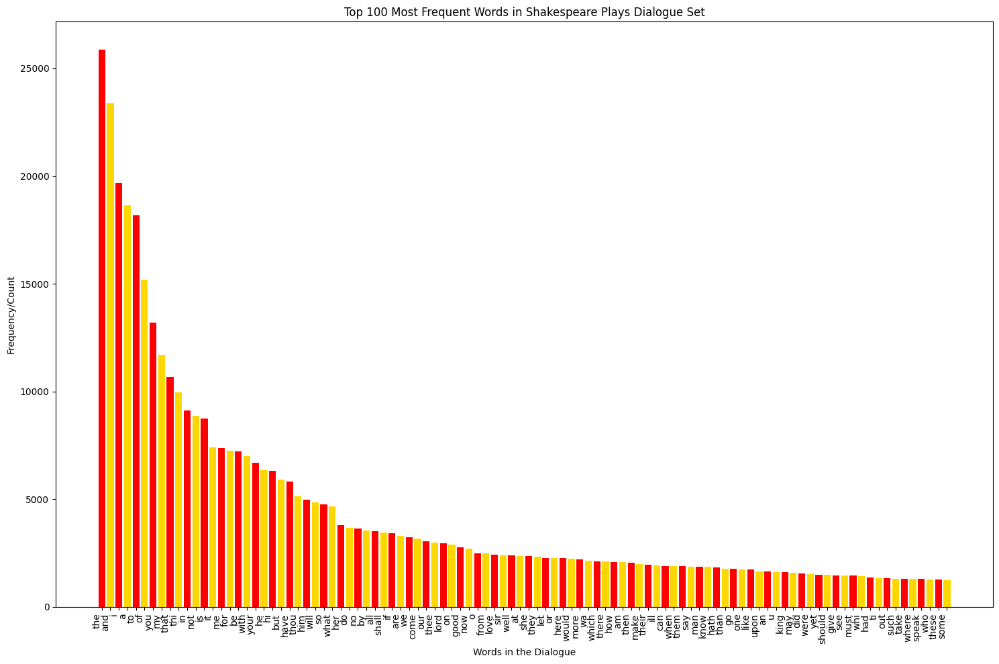

In [ ]:
# visualise the top 100 words used by the big guy shakespeare himself in a bar chart so we can see what are the words most likelu to appear in our future generated text output

# Get and store the words followed by their count
words = [word for word, frequency in top_100_words] # store the word
frequencies = [frequency for word, frequency in top_100_words] # store the words freq count

# Create the top frequent word bar plot
plt.figure(figsize=(15, 10))

# Actually define the bar chart with the top 100 most freq words in alternating color and annotations
colors = ['red', 'gold'] * (len(words) // 2)  # define alternating color pattern for more easily reading the most frequent words in our shakespeare dialogues
colors += colors[:len(words) % 2]  # switch color for every next word

# Annotate and show the most freq bar chart
plt.bar(words, frequencies, color=colors) # allows for my plot to have my custom color scheme as define above
plt.xlabel("Words in the Dialogue")
plt.ylabel("Frequency/Count")
plt.title("Top 100 Most Frequent Words in Shakespeare Plays Dialogue Set")
plt.xticks(rotation=90, ha='right')
plt.tight_layout()

# output the top 100 most freq bar chart
plt.show() # these words would presumebly he most frequent in our generated text also if the models suceed in generating shake-speare like text.

In [ ]:
# create a final dialogue column which is just a copy of the Lemmatised dialogue
plays['Final_Dialogue'] = plays['Lemmatized_Dialogue'] # this will be what the word representation vector models work on, which after vectorisation we can use with our two NLG pipelines and then evaluate them

In [ ]:
# Save the plays DataFrame to a local CSV file, in-case of the kaggle source goes down or is unreachaable et cetera
plays.to_csv('plays_cleaned_and_tokenised.csv', index=False)

In [ ]:
# Outputs the Plays dataframe, now fully pre-processed and ready for my section 2 of learning the word representations using the below 3 models.
plays

,PlayerLine,Cleaned_Dialogue,Tokenised_Dialogue,Stemmed_Dialogue,Lemmatized_Dialogue,Final_Dialogue
0,"So shaken as we are, so wan with care,",so shaken as we are so wan with care,"[so, shaken, as, we, are, so, wan, with, care]","[so, shaken, as, we, are, so, wan, with, care]","[so, shaken, a, we, are, so, wan, with, care]","[so, shaken, a, we, are, so, wan, with, care]"
1,"Find we a time for frighted peace to pant,",find we a time for frighted peace to pant,"[find, we, a, time, for, frighted, peace, to, ...","[find, we, a, time, for, fright, peac, to, pant]","[find, we, a, time, for, fright, peac, to, pant]","[find, we, a, time, for, fright, peac, to, pant]"
2,And breathe short-winded accents of new broils,and breathe shortwinded accents of new broils,"[and, breathe, shortwinded, accents, of, new, ...","[and, breath, shortwind, accent, of, new, broil]","[and, breath, shortwind, accent, of, new, broil]","[and, breath, shortwind, accent, of, new, broil]"
3,To be commenced in strands afar remote.,to be commenced in strands afar remote,"[to, be, commenced, in, strands, afar, remote]","[to, be, commenc, in, strand, afar, remot]","[to, be, commenc, in, strand, afar, remot]","[to, be, commenc, in, strand, afar, remot]"
4,No more the thirsty entrance of this soil,no more the thirsty entrance of this soil,"[no, more, the, thirsty, entrance, of, this, s...","[no, more, the, thirsti, entranc, of, thi, soil]","[no, more, the, thirsti, entranc, of, thi, soil]","[no, more, the, thirsti, entranc, of, thi, soil]"
...,...,...,...,...,...,...
104985,"Is troth-plight to your daughter. Good Paulina,",is trothplight to your daughter good paulina,"[is, trothplight, to, your, daughter, good, pa...","[is, trothplight, to, your, daughter, good, pa...","[is, trothplight, to, your, daughter, good, pa...","[is, trothplight, to, your, daughter, good, pa..."
104986,"Lead us from hence, where we may leisurely",lead us from hence where we may leisurely,"[lead, us, from, hence, where, we, may, leisur...","[lead, us, from, henc, where, we, may, leisur]","[lead, u, from, henc, where, we, may, leisur]","[lead, u, from, henc, where, we, may, leisur]"
104987,Each one demand an answer to his part,each one demand an answer to his part,"[each, one, demand, an, answer, to, his, part]","[each, one, demand, an, answer, to, hi, part]","[each, one, demand, an, answer, to, hi, part]","[each, one, demand, an, answer, to, hi, part]"
104988,Perform'd in this wide gap of time since first,performd in this wide gap of time since first,"[performd, in, this, wide, gap, of, time, sinc...","[performd, in, thi, wide, gap, of, time, sinc,...","[performd, in, thi, wide, gap, of, time, sinc,...","[performd, in, thi, wide, gap, of, time, sinc,..."


In [ ]:
# Get the total bytes consumed by the elements of the DataFrame of the final pre-processed state of my target plays dataframe
final_size = plays.memory_usage(index=True, deep=True).sum()

# Convert size from bytes to megabytes
final_size = final_size / (1024 * 1024)

# round to 0 dp and output the memory cost of thecomplete pre proccessed plays dataframe
print('Size of our target plays dataFrame in it\'s pre-processed form:')
print(round(final_size, 0), 'MB') # add MB suffix for easier interpraiton/legibility

Size of our target plays dataFrame in it's pre-processed form:
78.0 MB


In [ ]:
# show the size diff from orginal to pre-rpcoess
memory_pd_delta = final_size - size_initial

# Output the size diff between init state and pre-processed state.
print('Size diff from our complete pre-processing towards when I first retrieved and turned the plays into a pandas dataFrame:')
print(round(memory_pd_delta, 0), 'MB') # add's the MB

Size diff from our complete pre-processing towards when I first retrieved and turned the plays into a pandas dataFrame:
45.0 MB


### **Section 2: Representation Learning**

After completition of the exhuasative and necessary pre-processing section, we can turn our desired target feature PlayerLine which has been completely pre-processed nad tokenised into a representation learning of 3 word vectorisating models, namely word2vec, fast text and GloVE which will generate a word vectorisation model of the shakespearian dialogue.

Word2Vec generates vector representation of a given list of words, in my case the pre-processed dialogue. Assigining/mapping a vector/numerical signature to each word. Tries to captures context by analysing surrounding words.

Fast Text also learns the vector word embeddings of a given corpus, priorising subword context, sets that make-up a individual word.

GloVE, like the previous 2 also takes words inputs and generates through an unsuporvised NN approach output vectors of each given word. Does this by using global word co-occurences, how often a word in the corpus occurs multiple times.

Therefore we have 3 vector-word-representations created and able to choose from. Allows for me to have greater options when generating and evaluating my algorithms.

For each model, I visualised the 2d representation positions and all 3 visuals showed healthy and typical representations, also evaluated was the run-time where all 3 compiled/ran in a respectable time.

#### **Word Representation Model 1: Word2Vec**

In [ ]:
# Lets define a function to vectorise given dialogue into vectorised form of all the words in what was the PlayerLine column
def create_vectorised_dialogue(dialogue):
    # Create a Word2Vec model
    w2v_model = Word2Vec(sentences=dialogue, vector_size=100, window=5, min_count=1, workers=4)

    # create a empty list to store the word2vec model output
    vectorised_dialogue = []

    # get each word and vectorise it
    for sentence in dialogue:  # Iterate through sentences in our Tokenized PlayerLine input
      for word in sentence:  # Iterate through words in the sentence
        if word in w2v_model.wv: # check if the word is in the word 2 vector
          vectorised_dialogue.append(w2v_model.wv[word]) # append the w2v created word embedding to the once empty vectorised dialogue list

    # return the word 2 vec vectorised dialogue
    return vectorised_dialogue

In [ ]:
# Let's test if the word2vec model is actually working, so we do a most similiar check to see if the words most similiar are logical or not in the shakespeare context

# create the w2v model
w2v_model = Word2Vec(sentences=plays['Tokenised_Dialogue'], vector_size=100, window=5, min_count=1, workers=4)

In [ ]:
# get most similiar word for 'god' from the word 2 vec model
w2v_model.wv.most_similar('god')

[('gods', 0.8435491919517517),
 ('master', 0.8273094296455383),
 ('patience', 0.8223010897636414),
 ('leave', 0.8168553709983826),
 ('mercy', 0.8135760426521301),
 ('sir', 0.8134669065475464),
 ('madam', 0.8059042692184448),
 ('grace', 0.8048253655433655),
 ('lady', 0.8018020391464233),
 ('brutus', 0.7989097833633423)]

In [ ]:
# show the most similiar words to 'shovel' as known by the above created word 2 vector model
w2v_model.wv.most_similar('shovel')

[('messenger', 0.8595121502876282),
 ('member', 0.8586645722389221),
 ('sisterhood', 0.8572012782096863),
 ('cankerd', 0.8549849390983582),
 ('halting', 0.8537333607673645),
 ('kennel', 0.8536393642425537),
 ('chair', 0.8487340211868286),
 ('maria', 0.8476249575614929),
 ('fairy', 0.8463873267173767),
 ('drove', 0.8457491397857666)]

In [ ]:
# get most similiar words or representations of the word 'denmark'
w2v_model.wv.most_similar('denmark')

[('tybalt', 0.9636684656143188),
 ('kent', 0.9591270089149475),
 ('welsh', 0.9581168293952942),
 ('lean', 0.9573840498924255),
 ('dotes', 0.9564152956008911),
 ('mortality', 0.9563389420509338),
 ('ambitious', 0.9559736847877502),
 ('iago', 0.9548987150192261),
 ('shepherds', 0.9534228444099426),
 ('approved', 0.9528977870941162)]

In [ ]:
# use the word 2 vec model to get the total words used in the provided corpus (the lemmatized dialgue feature contents)
w2v_model.corpus_total_words

783292

In [ ]:
# get the count of dialogue entries in the corpus of the word 2 vector model defined from our my pre processed playerline feature
w2v_model.corpus_count

104990

In [ ]:
# get how long the word 2 vec model took to train on our plays corpus
print("The Plays corpus took", round(w2v_model.total_train_time, 2), "seconds to train the word 2 vec model.")

The Plays corpus took 4.92 seconds to train the word 2 vec model.


In [ ]:
# store the vectorisation
vectorised_dialogue = create_vectorised_dialogue(plays['Lemmatized_Dialogue'])

In [ ]:
# output the vectorisation representation of the tokenised dialogue.
vectorised_dialogue

[array([-0.6062598 ,  1.6550212 , -0.4730694 , -0.03551861,  1.36438   ,
        -0.8521162 , -0.2462397 ,  0.5100225 , -1.2978005 ,  0.69337094,
        -0.53230214,  0.31850058,  0.4038652 ,  0.19294897,  1.0418324 ,
        -0.5148634 , -0.4345341 , -0.61701363, -0.5121131 , -1.6609945 ,
         0.16171026, -0.42518952,  0.20638959, -0.04975059, -0.6897537 ,
        -0.13213494, -0.22397688,  0.15387745, -0.5290422 ,  1.1680838 ,
         0.9811758 , -0.6684512 , -0.51720744,  0.7597998 , -0.03708283,
         1.672105  ,  0.14228341, -0.03105078, -0.18300746, -1.1092418 ,
         0.16285372, -0.6012327 , -0.5580387 ,  0.91902703,  0.01388553,
        -0.07217266,  0.63614976, -0.7298706 ,  0.8426521 ,  0.8919645 ,
        -0.33450168, -0.34919465, -0.27823034, -0.5764877 ,  0.26887912,
         1.323803  ,  0.3879086 ,  0.39333543, -1.1046157 , -1.5515378 ,
         0.14107291, -0.71648383,  0.42771417, -0.42204413, -0.6448742 ,
         0.06496161,  0.33898494,  0.511214  , -1.6

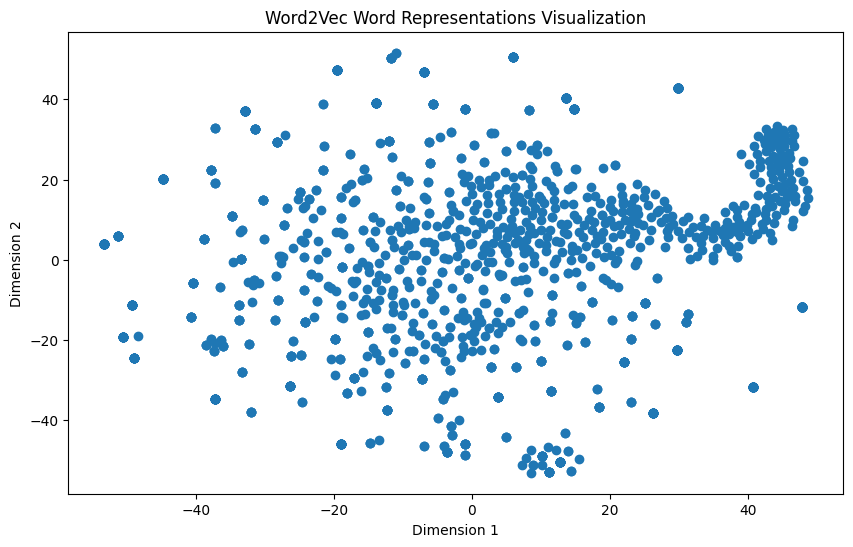

In [ ]:
# Visualise the Word2Vec word embdeddings

# We have to choose a subset of the model, and optimise the tsne visualiser as the word2vector visualisation would take an ungodly amount of time compared to the other two embeddors if not.
subset_size = 1500 # create a sample size of 1500, as for the model not to take centuries to compile
subset_indices = random.sample(range(len(vectorised_dialogue)), subset_size) # sample for each row in the word2vec model, constraint by the above defined subset size
subset_vectors = [vectorised_dialogue[i] for i in subset_indices] # get the subset vectors as constraint by the indices of the subset

# convert to numpy array
word_vectors = np.array(subset_vectors)

# perform some tsne optimisations to cut down on runtime cost as we want the project to run in a reasonable span of time
tsne = TSNE(n_components=2, perplexity=30, early_exaggeration=12.0, max_iter=500, method='barnes_hut', random_state=47)
reduced_vectors = tsne.fit_transform(word_vectors) # fill from the optimisations above, performed on the w2v vectors

# Create the word2vec visualisation
plt.figure(figsize=(10, 6)) # give the model ample space to show each axis without dodgy cropping
plt.scatter(reduced_vectors[:, 0], reduced_vectors[:, 1]) # scatter based on the vector values
plt.title("Word2Vec Word Representations Visualization") # give our visualisation. a title,
plt.xlabel("Dimension 1") # label x axis
plt.ylabel("Dimension 2") # label y axis

plt.show() # Output my word2vec word representation visualisation

In [ ]:
# get how many word embeddings the word2vec model produced
print(len(vectorised_dialogue))

783292


#### **Word Representation Model 2: Fast Text**

In [ ]:
# deine a path for a temporary file ,to use as a training data source
temp_file_path = "temp_training_data.txt"

# Join the tokens in each row with spaces and write to the temporary file
with open(temp_file_path, "w") as f:
  # for each line in the lemmatized fully pre-processed feature
  for line in plays['Lemmatized_Dialogue']:
    # write to the temp file
    f.write(" ".join(line) + "\n")

# create the fast text model based on the text appended to the temp file as created in the above temp file handling block
fast_text_model = fasttext.train_unsupervised(temp_file_path, model='skipgram') # use the skipgram model

# Remove the temporary file once we have defined the fast text model
os.remove(temp_file_path)

In [ ]:
# get most similiar words to the word 'hamlet' as generated from the above created fast text model
fast_text_model.get_nearest_neighbors('hamlet')

[(0.9624133110046387, 'dromio'),
 (0.9601532220840454, 'camillo'),
 (0.953909158706665, 'ero'),
 (0.9538687467575073, 'horatio'),
 (0.9538237452507019, 'silvia'),
 (0.9535658359527588, 'hardi'),
 (0.9516621828079224, 'hubert'),
 (0.951204776763916, 'nurs'),
 (0.9502960443496704, 'pisanio'),
 (0.9476135969161987, 'curio')]

In [ ]:
# get nearest neighbours for angel
fast_text_model.get_nearest_neighbors('angel')

[(0.9780976176261902, 'changel'),
 (0.9747122526168823, 'apollo'),
 (0.9743756055831909, 'school'),
 (0.9739391207695007, 'transpar'),
 (0.9739342331886292, 'tangl'),
 (0.9732123613357544, 'jig'),
 (0.9725216627120972, 'muffl'),
 (0.9720551371574402, 'placket'),
 (0.9711077213287354, 'spaniel'),
 (0.9708164930343628, 'cook')]

In [ ]:
# get nearest neighbour for castle
fast_text_model.get_nearest_neighbors('castle')

[(0.9922686219215393, 'castl'),
 (0.9829093813896179, 'banquet'),
 (0.9802241921424866, 'staff'),
 (0.9801144003868103, 'chamberwindow'),
 (0.9783350825309753, 'basket'),
 (0.9757388234138489, 'rous'),
 (0.9754803776741028, 'banquo'),
 (0.9749994277954102, 'clap'),
 (0.9749755859375, 'robin'),
 (0.9736382961273193, 'campeiu')]

In [ ]:
# get the fast text model word embeddings vectors
words = fast_text_model.get_words()

# output the list of words from the fast text model
words

['</s>',
 'the',
 'and',
 'i',
 'a',
 'to',
 'of',
 'you',
 'my',
 'that',
 'thi',
 'in',
 'not',
 'is',
 'it',
 'me',
 'for',
 'be',
 'with',
 'your',
 'he',
 'hi',
 'but',
 'have',
 'thou',
 'him',
 'will',
 'so',
 'what',
 'her',
 'do',
 'no',
 'by',
 'all',
 'shall',
 'if',
 'are',
 'we',
 'come',
 'our',
 'thee',
 'lord',
 'on',
 'good',
 'now',
 'o',
 'from',
 'love',
 'sir',
 'well',
 'at',
 'she',
 'they',
 'let',
 'or',
 'here',
 'would',
 'more',
 'wa',
 'which',
 'there',
 'how',
 'am',
 'then',
 'make',
 'their',
 'ill',
 'can',
 'when',
 'them',
 'say',
 'man',
 'know',
 'hath',
 'than',
 'go',
 'one',
 'like',
 'upon',
 'an',
 'u',
 'king',
 'may',
 'did',
 'were',
 'yet',
 'should',
 'give',
 'see',
 'must',
 'whi',
 'had',
 'ti',
 'out',
 'such',
 'take',
 'where',
 'speak',
 'who',
 'these',
 'some',
 'too',
 'god',
 'time',
 'most',
 'heart',
 'tell',
 'think',
 'mine',
 'hand',
 'father',
 'look',
 'up',
 'eye',
 'much',
 'never',
 'hear',
 'great',
 'nor',
 'men',
 

In [ ]:
# get the total word count of used in fast text model
print(len(words))

6372


In [ ]:
# get the word_vectors of the fast text model
word_vectors = [fast_text_model.get_word_vector(word) for word in words]

# output word vectors representation in their numerical form (large input)
print(word_vectors)

[array([-1.29310206e-01,  3.58455569e-01, -2.47345880e-01,  6.93028644e-02,
        2.90091932e-01,  2.52871692e-01,  2.84254625e-02, -1.56510025e-01,
        1.46064058e-01,  1.10818453e-01,  2.05981553e-01,  2.67599285e-01,
        1.17255472e-01,  1.71436369e-01, -4.10060883e-02, -6.69379681e-02,
        2.32342839e-01,  1.06579594e-01, -3.56127061e-02, -6.09572697e-03,
        1.00740358e-01,  1.66985020e-01,  4.26413715e-02, -2.07954440e-02,
        4.46246751e-02, -2.02213988e-01,  1.37386143e-01,  2.12911386e-02,
        4.11514901e-02,  1.60868898e-01,  1.04265794e-01, -2.23691002e-01,
       -3.17899138e-01, -1.82143465e-01, -3.54960233e-01, -1.19253218e-01,
        1.05119042e-01, -2.41762400e-01, -1.18704904e-02, -1.11953475e-01,
       -1.24457940e-01,  1.01236753e-01, -3.07434667e-02,  2.90562689e-01,
        6.80816993e-02, -2.22612750e-02,  1.44322082e-01, -4.50730138e-02,
       -7.92321190e-03, -1.47141308e-01, -1.46109164e-01,  1.75702140e-01,
       -2.16246247e-01, 

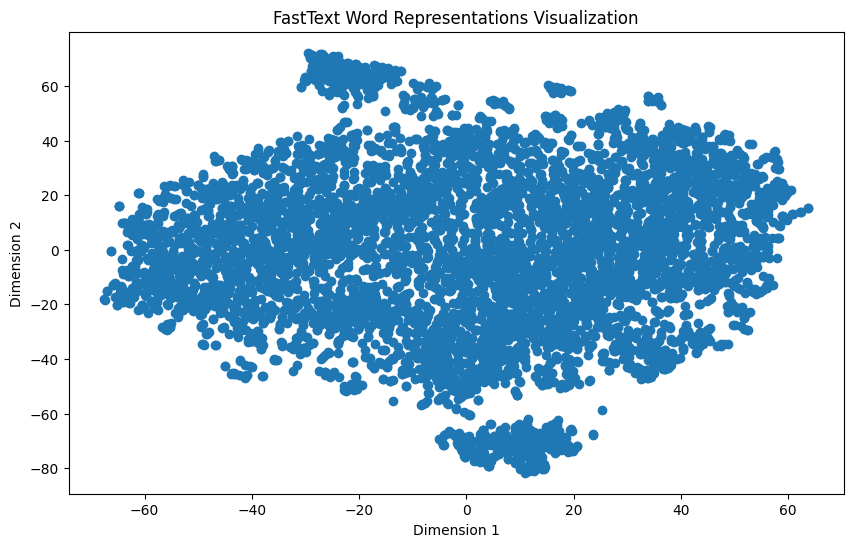

In [ ]:
# Convert the list of word vectors to a NumPy array
word_vectors = np.array(word_vectors)

# use tsne to shape to 2 dimensions, use random state 47 as in the other embedding visualisations
tsne = TSNE(n_components=2, random_state=47)
# fit the transformations
reduced_vectors = tsne.fit_transform(word_vectors)

# create the scatter plot for the 2d word representations from the fast text model
plt.figure(figsize=(10, 6)) # size as the other word representation models
plt.scatter(reduced_vectors[:, 0], reduced_vectors[:, 1]) # plant the x and y sources from the fast text model
plt.title("FastText Word Representations Visualization") # give our plot a title
plt.xlabel("Dimension 1") # x axis label
plt.ylabel("Dimension 2") # y axis label

plt.show() # output the representation scatter plot of the projects fast text model

In [ ]:
# get the number of word vector representations as created by the fast text model
print(len(word_vectors))

6372


#### **Word Representation Model 3: GloVE**

In [ ]:
# Create the glove representation learning model

# define the corpus from our pre-processed data
corpus = Corpus()
corpus.fit(plays['Lemmatized_Dialogue'], window=10)

# create the actual glove word representation model
glove = Glove(no_components=200, learning_rate=0.07)

glove.fit(corpus.matrix, epochs=10, no_threads=4) # use 10 epochs, 4 threads
glove.add_dictionary(corpus.dictionary) # add the corpus to the glove model

In [ ]:
# function to help evaluate the gloVE model to the other two
def create_glove_vectorised_dialogue(dialogue):
  glove_vectorised_dialogue = [] # array to store the vectorisations generated from the GloVE model

  # for each word in the give dialogue (our shakespeare one fully pre-processed)
  for sentence in dialogue:
    for word in sentence:
      # check if word in known glove dict
      if word in glove.dictionary:
        # add the gloVE vectorisation of that word to the returned array
        glove_vectorised_dialogue.append(glove.word_vectors[glove.dictionary[word]])

  # returns the dialogue vectorised using the gloVE model
  return glove_vectorised_dialogue

In [ ]:
# output the word vectors of the glove model of our pre-processed shakespeare play data
create_glove_vectorised_dialogue(plays['Lemmatized_Dialogue'])

[array([ 0.0213447 , -0.18671623, -0.01850522, -0.24900742,  0.00952215,
         0.06511578, -0.17407549,  0.14163857,  0.11593676,  0.06293899,
         0.09575759, -0.1945119 ,  0.04902918, -0.07123538, -0.00811339,
         0.08850729,  0.17708487,  0.10940576,  0.18479215, -0.15864252,
         0.03940698,  0.18451118, -0.10718233,  0.05220998, -0.17094323,
         0.21034024, -0.0770726 ,  0.22190234,  0.1003289 , -0.03611017,
        -0.16969312,  0.199103  , -0.12020669,  0.27117446, -0.19938354,
        -0.1836221 ,  0.1431709 , -0.1362873 , -0.04207691, -0.13859663,
        -0.10166764,  0.17655421,  0.02051796,  0.02424592,  0.22151946,
        -0.18109265,  0.10430635, -0.16081619,  0.22113521, -0.05709246,
        -0.05313566, -0.12903687, -0.02650548, -0.18446031,  0.1888309 ,
         0.22380657, -0.13280508,  0.22437447, -0.09823374,  0.00058903,
         0.17439831,  0.1673561 , -0.04721044, -0.10457168,  0.16250314,
         0.1700695 ,  0.20351393,  0.09231379, -0.2

In [ ]:
# get and output the most similiar words to 'macbeth' within the glove word vector representation model
print(glove.most_similar('macbeth', number=10))

# get similar words to england
print(glove.most_similar('england', number=10))

#get similar words to rose
print(glove.most_similar('rose', number=10))

[('allegi', 0.903045200958597), ('chees', 0.8895996359515487), ('berri', 0.8858578844410017), ('consort', 0.879272355166978), ('titiniu', 0.8780305537153583), ('emilia', 0.8729696566179311), ('bolin', 0.8726274559016038), ('goldbound', 0.8714820559504414), ('cub', 0.8709423453043196)]
[('franc', 0.9666903996964443), ('rome', 0.9578545821209324), ('act', 0.9518214045175424), ('forc', 0.9460204848173919), ('virtu', 0.9387354435117148), ('shape', 0.9241690592882901), ('action', 0.9231722216833316), ('offic', 0.9227523328108863), ('age', 0.9202887328790957)]
[('mountain', 0.9706890028632443), ('tree', 0.961829286436162), ('golden', 0.961676147301167), ('summer', 0.9556269736696414), ('silver', 0.9546798994976966), ('bark', 0.9544840428180414), ('rock', 0.946407006528926), ('tabl', 0.9439150815979307), ('third', 0.9419935807682274)]


In [ ]:
# print some word vectors in the glove model
print(glove.word_vectors)

[[ 2.13447035e-02 -1.86716235e-01 -1.85052166e-02 ... -1.23386076e-01
   6.49955756e-02  1.41645135e-01]
 [-1.90965998e-03  1.45528379e-02 -4.58797634e-03 ... -4.49630695e-03
  -7.78579221e-04  2.35919295e-03]
 [-2.78540847e-01 -1.52641435e-01  2.54745228e-02 ...  4.37869597e-02
  -5.90119006e-01  6.23619758e-02]
 ...
 [ 5.02398656e-03  7.07640971e-03  3.56038806e-03 ...  1.42114734e-03
  -5.42295673e-05 -3.13952718e-03]
 [ 3.49085120e-03  1.09683970e-02  5.20791231e-03 ... -3.72815827e-03
  -4.65730110e-03 -2.66723011e-04]
 [ 2.63605795e-03  4.32050567e-03  1.05958520e-03 ... -2.33728763e-03
  -1.79768276e-03 -1.26785681e-03]]


In [ ]:
# get the number of word vectors generated by the glove model
print(len(glove.word_vectors))

18344


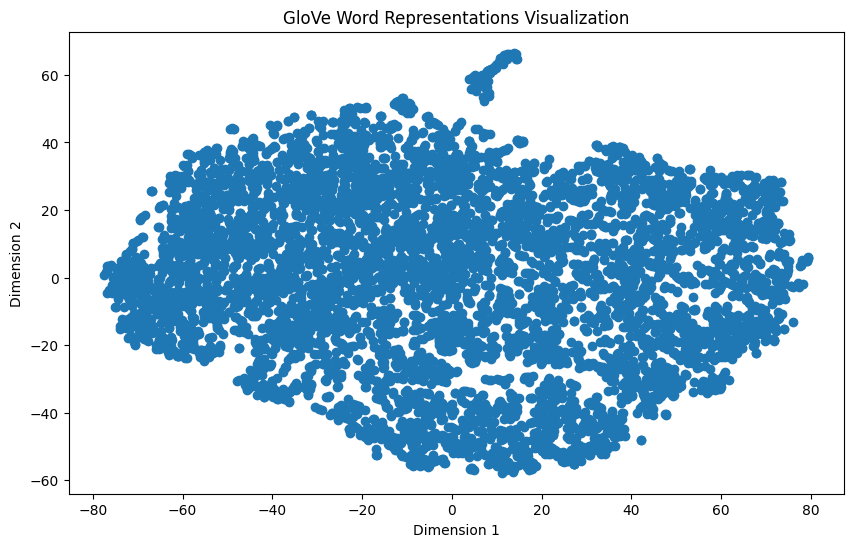

In [ ]:
# Visualisation of GloVE model

# get the word representation words form our glove model
word_vectors = [glove.word_vectors[glove.dictionary[word]] for word in words if word in glove.dictionary]

# convert to np array
word_vectors_array = np.array(word_vectors)

# optimise size so it doesn't take centuries for the visualisation to show
tsne = TSNE(n_components=2, random_state=47) # ensure it's 2 dimensions
reduced_vectors = tsne.fit_transform(word_vectors_array) # optimise using tsne on our glove model

# create a scatter plot of our gloVE model
plt.figure(figsize=(10, 6)) # same size as previous 2 visualisations
plt.scatter(reduced_vectors[:, 0], reduced_vectors[:, 1]) # give it the data on each axis
plt.title("GloVe Word Representations Visualization") # give it a title
plt.xlabel("Dimension 1") # x axis title
plt.ylabel("Dimension 2") # y axis title

plt.show() # output the glove visualisation scatter plot

In [ ]:
# Function to determine the runtime in secounds cost of each NLG model I have used within this project, this runtime_cost function was re-used from the future section evaluation and in this instance evaluates the word vectorisation model runtime cost
def runtime_cost(model, *args, **kwargs): # perform the wanted nth number of keywords to be performed on inferred models either our ngrams or markov chain nlg models as defined above in section 3
  start_time = time.time() # capture the star time before the model is run
  model(*args, **kwargs) # perform the nlg model as described previously
  end_time = time.time() # capture the end time, after the model as completed, thus capturing the total from start to model end, effectively capturing bow long the model took to run and halt well finish.
  runtime_cost = end_time - start_time # compute the runtime cost, by getting end time taking away tbe start time, returning the delta of the actual running time the model took to be interprerated by python

  # return the runtime cost in secounds for the model
  return runtime_cost

In [ ]:
# function to create a fast text word representation, this is used only once so we can evaluate runtimes
def create_fast_text_vectorised_dialogue():
  # deine a path for a temporary file ,to use as a training data source
  temp_file_path = "temp_training_data.txt"

  # Join the tokens in each row with spaces and write to the temporary file
  with open(temp_file_path, "w") as f:
    # for each line in the lemmatized fully pre-processed feature
    for line in plays['Lemmatized_Dialogue']:
      # write to the temp file
      f.write(" ".join(line) + "\n")

  # create the fast text model based on the text appended to the temp file as created in the above temp file handling block
  fast_text_model = fasttext.train_unsupervised(temp_file_path, model='skipgram') # use the skipgram model

  # Remove the temporary file once we have defined the fast text model
  os.remove(temp_file_path)

In [ ]:
# get runtime cost of each word vector embeddoring (w2v, fast text and gloVe)
w2v_runtime_cost = runtime_cost(create_vectorised_dialogue, plays['Lemmatized_Dialogue']) # runtime cost for w2v model
fast_text_runtime_cost = runtime_cost(create_fast_text_vectorised_dialogue) # runtime cost for fast text model
glove_runtime_cost = runtime_cost(create_glove_vectorised_dialogue, plays['Lemmatized_Dialogue']) # runtime cost for glove model

#### **Evaulation**

In [ ]:
# output runtime cost of performing each vectorisation embedding, as the models are quick enough this should be in secounds and thus I added the secounds string add-on so it's more readable and understandable
print("W2V runtime cost:", round(w2v_runtime_cost, 2), "seconds")
print("Fast Text runtime cost:", round(fast_text_runtime_cost, 2), "seconds")
print("GloVe runtime cost:", round(glove_runtime_cost, 2), "seconds")

W2V runtime cost: 6.95 seconds
Fast Text runtime cost: 36.25 seconds
GloVe runtime cost: 0.48 seconds


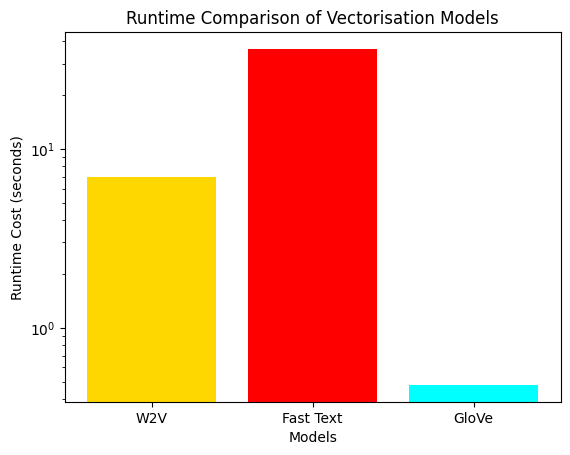

In [ ]:
# bar chart plot of each vectorisation model embedding runtime
models = ['W2V', 'Fast Text', 'GloVe'] # define the models
runtime_costs = [w2v_runtime_cost, fast_text_runtime_cost, glove_runtime_cost] # enumerate the runtime cost of all 3 of my models

# lets create the bar plot
plt.bar(models, runtime_costs, color=['gold', 'red', 'cyan']) # feed it the models labels, the runtime cost and my colour palette
plt.xlabel('Models') # x axis label for the models
plt.ylabel('Runtime Cost (seconds)') # y label for the duration of the runtime
plt.yscale('log') # set the scale of our y axis to logarthimic as our later two models are significantly faster than the w2v and would appear invisible well ultra small if we stick to linear scaling
plt.title('Runtime Comparison of Vectorisation Models') # title for the bar plot

plt.show() # show the word embedding bar plot, to evaluate each models runtime speed to completion

In [ ]:
# define some shakespear relevant word pairs for the plays data
plays_word_pairs = [('right', 'wrong'), ('fear', 'hope'), ('lust', 'love'), ('day', 'night'), ('friend', 'foe'), ('poor', 'rich'), ('old', 'young'), ('romeo', 'juliet')]

In [ ]:
# gets word similiarty using cosine between 2 vectors
def cosine_similarity(v1, v2):
    return np.dot(v1, v2) / (np.linalg.norm(v1) * np.linalg.norm(v2))

In [ ]:
# arrays to store the similiarities returned
w2v_sims = []
ft_sims = []
glove_sims = []

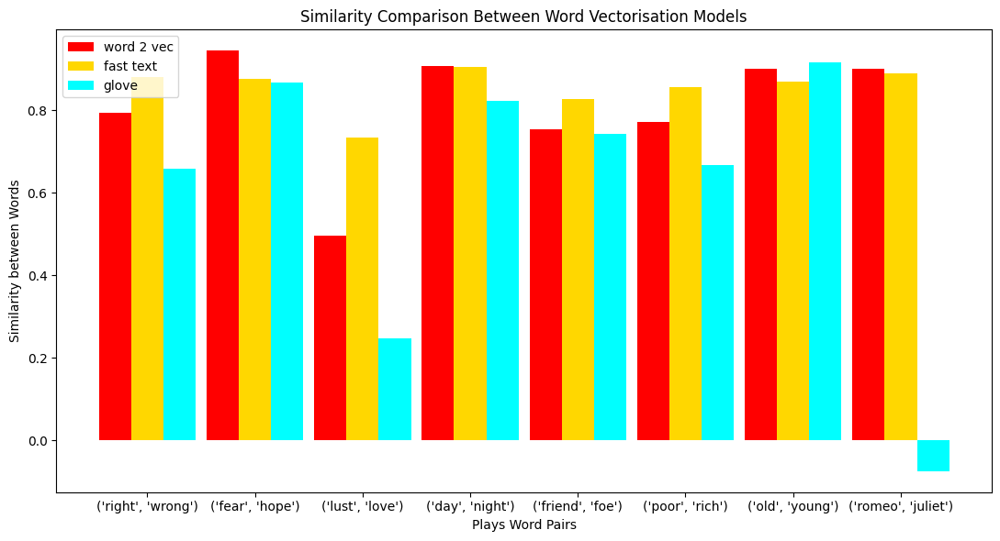

In [ ]:
# for each word pair
for pair in plays_word_pairs:
    # define the words of the pair
    word1, word2 = pair

    # Word2Vec model setup and get similiarity of the pairing
    w2v_sim = cosine_similarity(w2v_model.wv[word1], w2v_model.wv[word2]) if (word1 in w2v_model.wv and word2 in w2v_model.wv) else None
    w2v_sims.append(w2v_sim)

    # Fast Text model setup of the pair
    v1 = fast_text_model.get_word_vector(word1)
    v2 = fast_text_model.get_word_vector(word2)

    # get the fast text simulatinos using the cosine similarity function
    ft_sim = cosine_similarity(v1, v2)
    ft_sims.append(ft_sim)

    # Glove model setup of the pair
    v1 = glove.word_vectors[glove.dictionary[word1]]
    v2 = glove.word_vectors[glove.dictionary[word2]]

    # get the glove similiarity of the pairs
    glove_sim = cosine_similarity(v1, v2) if (word1 in glove.dictionary and word2 in glove.dictionary) else None
    glove_sims.append(glove_sim)

# ensure width of bars is readable
bar_width = 0.3
x_pos = np.arange(len(plays_word_pairs))

# Define the actual bar plotting
plt.figure(figsize=(11, 6))
plt.bar(x_pos, w2v_sims, width=bar_width, label='word 2 vec', color='red')
plt.bar(x_pos + bar_width, ft_sims, width=bar_width, label='fast text', color='gold')
plt.bar(x_pos + 2 * bar_width, glove_sims, width=bar_width, label='glove', color='cyan')

# Annotation of the bar plot
plt.xlabel('Plays Word Pairs')
plt.ylabel('Similarity between Words')
plt.title('Similarity Comparison Between Word Vectorisation Models')
plt.xticks(x_pos + bar_width, plays_word_pairs)
plt.legend()
plt.tight_layout()

# Output the word-pair similiarity word representation model comparison bar chart
plt.show()

In [ ]:
# store all 3 models in a array
all_representation_learning_models = []

# in sequence, add all 3 of my projects models to the above array
all_representation_learning_models.append(w2v_model) # store w2v model
all_representation_learning_models.append(fast_text_model) # store fast text model
all_representation_learning_models.append(glove) # store gloVE model

In [ ]:
# show that the objects actually exist and were appended correctly
print(all_representation_learning_models)

[<gensim.models.word2vec.Word2Vec object at 0x7925010d5270>, <fasttext.FastText._FastText object at 0x792483ae63b0>, <glove.glove.Glove object at 0x792503941150>]


In [ ]:
# Create an empty dictionary to store each word vector representation model memory size.
model_sizes = {}

# loop through all 3 models
for model in all_representation_learning_models:
  # get their name
  rl_model_name = type(model).__name__

  # Check if the corresponding rl model has a memory usage method so that we can calculate the memory usage of the targetted rl model
  if hasattr(model, 'memory_usage'):
    # get the models memory size
    size = model.memory_usage(index=True, deep=True).sum()

  # define the size of the models
  model_sizes[rl_model_name] = size

# Print the memory size of each word vecotr representation model
for rl_model_name, size in model_sizes.items():
  # output for each model, using fstrings to format the dictionary containing our model name and respective size.
  print(f"Memory size of the {rl_model_name} Representation Learning Model: {size} bytes")

# Then I proceed and get the total size, inclusive of all 3 models

# get the total size
total_size = sum(model_sizes.values())

# output the total size of all models.
print('\n')
print(f"Total memory size of all Representation Learning Models: {total_size} bytes")

Memory size of the Word2Vec Representation Learning Model: 48 bytes
Memory size of the _FastText Representation Learning Model: 48 bytes
Memory size of the Glove Representation Learning Model: 48 bytes


Total memory size of all Representation Learning Models: 144 bytes


In [ ]:
# convert vectorised dialogue to a numpy array
vectorised_dialogue = np.array(vectorised_dialogue)

# generate training and testing data to use as in aiding evaulation of the models
train_data, test_data = train_test_split(vectorised_dialogue, test_size=0.2, random_state=47)

# output the sizes of each data created above
print("Training data size:", len(train_data)) # output training sata size
print("Testing data size:", len(test_data)) # output testing training data size

Training data size: 626633
Testing data size: 156659


### **Section 3: Algorithms**

**Models/Pipelines** <br>
To generate short but sweat shakespeare text from my pre-processed and word representation learnt dialogue, I will deploy and craft the following pipelines involving the below two models:

*   NLG-Model/Pipeline 1 : **N-Grams**
*   NLG-Model/Pipeline 2 : **Markov Chains**

#### Model 1: N-Grams
Generates Shakespeare-like text from initially breaking down the input dialogue into chunks of 'N-Grams', effectively modelling the likely next word relations between words in my corpus, chiefly all of William Shakespears penned text/dialogue. <br><br>
We feed it the dialogue input, define the ngram size and give it a length that will constrain the generation to said length.
<br><br>
To start off the generation, a random N-Gram from the titual model is chosen, based on the model's relationship modelling, that is how often the words in the dialogue appear alongside one another, aims to pick the next word based on what the model believes to be the most is found to be most often associate with the current N-Gram word. <br><br>
Thereby predicting the next word in the generation based off of the frequencies scanned from the dialogues, and picks the most frequently associated word that pairs with the current word used by the N-Gram model and stopping until the desired length is reached. And all the words chosen by the computed frequency matrix of the dialogue. The model needs to remember/store many previous words in-order to deliver context based on the current next-word decision to deliver accurate results. <br><br>

The model picks each next word prediction through what the current N-Gram determines to most accurately have similiar relationships, meaning that patterns within the current word and next word are similiar, mostly considering position and frequent pairings of the words. In my case trying to pick up the style and patterns within the Shakespeare dialogue and aiming to statistically re-create it through similiarity of word occurence, for example (All, the, world's), a set of words that would have direct and therefore high next word probability.

In [ ]:
# Pipeline for the N-Grams Approach
# Model 1 : N-Grams Text Generation Approach

# The function that will create the actual ngrams model object and return the generate shakespeare text from it
def generate_text_ngrams(text, n, length):
  # create a dict for the ngram model
  ngram_model = defaultdict(Counter)

  # loop for the number of grams
  for gram in ngrams(text.split(), n):
    # apply the ngram model
    ngram_model[gram[:-1]][gram[-1]] += 1

  # get the current gram by choosing from the keys of the ngram model above
  current_gram = random.choice(list(ngram_model.keys()))

  # set the generate text
  generated_text = list(current_gram)

  # generate text for the given length
  for _ in range(length):

    # check if current gram in the ngram model
    if current_gram in ngram_model:
      # define the next word
      next_word = ngram_model[current_gram].most_common(1)[0][0]

      # add to the output generate tex
      generated_text.append(next_word)

      # get the current gram
      current_gram = tuple(generated_text[-n + 1:])

    else:
      break # if there is a problem with the grams stop the generation

  # Output the n-grams computed shakespeare text in string type obviously note the ""
  return " ".join(generated_text)

# Applying the pipelined model, and generating shakepseare text output
all_text = " ".join(plays['Cleaned_Dialogue'].tolist())

# lets invoke the function and generate our text, with our dialogue passed along with a ngram n count of 5.
generated_text = generate_text_ngrams(all_text, 5, 50)

# rename the above variable to be less generic
ngrams_output = generated_text

# Capitalise first word of ngrams_output
ngrams_output = ngrams_output.capitalize()

# Add a full-stop to the generated text
ngrams_output = ngrams_output + "."

In [ ]:
# With representation learning support, allows for the use of the 3 representation learning models representations
def generate_text_ngrams_with_vectors(word_vectors, model_type, n, length):

  # if given model is the wor2vec rl model
  if model_type == 'w2v':
      # grab the vocab
      vocabulary = word_vectors.wv.key_to_index
      # grab the vectors of the vocab
      word_vectors = word_vectors.wv.vectors

      # define the words
      words = list(vocabulary.keys())

  # if the given model is the fast text model instead
  elif model_type == 'fasttext':
      # get the fast text vocab
      vocabulary = word_vectors.get_words()
      words = vocabulary

      # get the fast text vectors representation of the words vocab
      word_vectors = [word_vectors.get_word_vector(word) for word in vocabulary]

  # Lastly check if it is the GloVE model we are dealing with
  elif model_type == 'glove':
      # get the vocab of the gloVE model
      vocabulary = list(word_vectors.dictionary.keys())

      # get the word vectors of gloVE
      word_vectors = word_vectors.word_vectors

      # ensure words is known as the vocab of the gloVE model
      words = vocabulary

  # give the ngram model a dict
  ngram_model = defaultdict(Counter)

  for i in range(len(word_vectors) - n + 1):
      gram = tuple(words[j] for j in range(i, i + n))
      ngram_model[gram[:-1]][gram[-1]] += 1

  # define the current gram
  current_gram = random.choice(list(ngram_model.keys()))
  # generate the init state of the generate text output stager
  generated_text = list(current_gram)

  # loop for the given length of the generated output
  for _ in range(length):
      # is the current gram in the ngram mode?
      if current_gram in ngram_model:
          # define the next word
          next_word = ngram_model[current_gram].most_common(1)[0][0]

          # add to output
          generated_text.append(next_word)

          # regenerate the current gram
          current_gram = tuple(generated_text[-n + 1:])
      else:
          break # handle if not in ngram model

  # Return the generated shakespeare text
  return " ".join(generated_text)

In [ ]:
# Test our ngrams vector pipeline on our 3 word representation models.
w2v_ngrams = generate_text_ngrams_with_vectors(w2v_model, 'w2v', 3, 50) # for word2vec
ft_ngrams = generate_text_ngrams_with_vectors(fast_text_model, 'fasttext', 3, 50) # for fast text
glove_ngrams = generate_text_ngrams_with_vectors(glove, 'glove', 3, 50) # for gloVE

In [ ]:
# Output for each of our word representation models
# print(w2v_ngrams)
# print(ft_ngrams)
# print(glove_ngrams)

#### Model 2: Markov Chains
Takes my given inputted dialogue representation and attempts to learn both the word patterns and word style and attempt to pick the most relevant char through the analysed and retrieved transisitions between these patterns between the corpus.<br><br>

These transistions are stored within a map, where the Markov Chains attempt to determine/scan what is the next word relation of each word in the dialogue, what each word tends to transition into, i.e. (to, be) (not, to, be), mapping what is most occurant words to switch into and creating numeric probabilities for each transition. <br><br>

Compare to the N-Grams model, context is only given to the actual word-transition, that being the last word, source to new scanned transition. Whereas the N-Grams model has to keep many n-grams deridded word frequencies assocications. Thus Markov Chains need to remember only a smaller set of words to chose the next word prediction based on it's probabilities. <br><br>

In practise this might mean the Markov Chain has less context and thus produces less accurate text as what might be picked up and visualised with BLEU, METEOR and ROUGE-1 scores, however could end up generating text with a much smaller run-time cost. <br><br>

The generated text would then contain an emulated shakespeare set of words remembering and capturing word transitions so that the words simulate the transitions William Shakespeare use in his playwriting. Where transitionary words have high markov chain probability and words that have no ordered relationship/transition have very low markov probability. And there explains how similiar words are picked and words that have nothing to do with each other are ignored/pushed so less likely to generate. The resultant shakespeare text output will then comprise of words that follow one another with high probability.


In [ ]:
# Pipeline for the Markov Chains approach
# Model 2 : Markov Chains Text Generation Approach

# Function to use markov chains to generate shakespeare text
def generate_text_markov(text, order, length, temperature=1.2):
  # create a dictionary for the markov model
  markov_model = defaultdict(lambda: Counter(defaultdict(lambda: 1)))

  # calculate the corpus size subbed by the given markov chain order
  for i in range(len(text) - order):
    # define the state, next_char and resize the markov model
    state = tuple(text[i:i + order])
    next_char = text[i + order]
    markov_model[state][next_char] += 1

  # function to take a sample for the next character chosen to be generated by the markov model, needs to know the state and allows for temperature from the markov model to modify it's probabitlies
  def sample_next_char(state, temperature=temperature):
    # get the choices
    choices = list(markov_model[state].elements())
    # set the weights
    weights = [markov_model[state][c] ** (1.0 / temperature) for c in choices]
    total_weight = sum(weights)

    # define the probability
    probs = [w / total_weight for w in weights]

    # determine the choice
    return random.choices(choices, weights=probs)[0]

  # get the current state from the mm
  current_state = random.choice(list(markov_model.keys()))
  # init define the generated text
  generated_text = list(current_state)

  # loop for the given/desired length of the generated text
  for _ in range(length):

    #  check if current state in the mmm
    if current_state in markov_model:
      # get the next chart
      next_char = sample_next_char(current_state)
      # append to generated text
      generated_text.append(next_char)
      # resize current state
      current_state = tuple(generated_text[-order:])

    else:
      break # break if not in markov model

  # returns the markov chain deridded shakespearian generated text
  return "".join(generated_text)

# apply on the dialogue, and use the markov model to generate shakespeare text
all_text = " ".join(plays['Cleaned_Dialogue'].tolist())

# generate some text using markov chains
generated_text = generate_text_markov(all_text, order=4, length=200, temperature=1.2) # uses a mm with an order of 4, max-length of 200 and a generic temp

#rename output
markov_chain_output = generated_text

# Capitalise the first word of the generated text from the markov chain model
markov_chain_output = markov_chain_output.capitalize()

# Add a full-stop to the generated text
markov_chain_output = markov_chain_output + "."

In [ ]:
# function to generate text with markov chain, with a choice of the 3 rl models
def generate_text_markov_with_vectors(word_vectors, model_type, length, similarity_threshold=0.7):

  # if we are dealing with a word2vec rl model
  if model_type == 'w2v':
      vocabulary = list(word_vectors.wv.key_to_index.keys())
      get_vector = lambda word: word_vectors.wv[word]

  # for the fast text model
  elif model_type == 'fasttext':
      vocabulary = word_vectors.get_words()
      get_vector = lambda word: word_vectors.get_word_vector(word)

  # lastly check for GloVE model presence
  elif model_type == 'glove':
      vocabulary = list(word_vectors.dictionary.keys())
      get_vector = lambda word: word_vectors.word_vectors[word_vectors.dictionary[word]]

  # create a dict for the markov chain
  markov_model = defaultdict(Counter)

  # create the set of words
  for text in plays['Cleaned_Dialogue'].tolist():
    words = text.split()

    for i in range(len(words) - 1):
      markov_model[words[i]][words[i + 1]] += 1

  # choose a word and set it as generated text
  current_word = random.choice(vocabulary)
  generated_text = [current_word]

  for _ in range(length):

      if current_word in markov_model:
          # creates a list of some most common combinations for the current word
          next_word_choices = markov_model[current_word].most_common()

          if not next_word_choices:
              # define set of similiar words to the current word
              similar_words = [word for word in vocabulary if word != current_word and np.dot(get_vector(current_word), get_vector(word)) / (np.linalg.norm(get_vector(current_word)) * np.linalg.norm(get_vector(word))) >= similarity_threshold]

              # if is a similar words exist to the current word
              if similar_words:
                  # set the new value of current word and iterate
                  current_word = random.choice(similar_words)
                  continue

              else:
                  break # break for unwanted scenario

          # pick the next word in the markov chain model
          next_word = random.choices([word for word, count in next_word_choices],weights=[count for word, count in next_word_choices])[0]

          # append the next word
          generated_text.append(next_word)

          # set the current word to the next word
          current_word = next_word

      else:
          break # if issue occurs, break out of the generation and stop.

  # return the generated shakespeare text
  return " ".join(generated_text)

In [ ]:
# Feed of the vector approach to the markov chain pipeline with our 3 word vector representation models
w2v_markov = generate_text_markov_with_vectors(w2v_model, 'w2v', 200, similarity_threshold=0.7)
ft_markov = generate_text_markov_with_vectors(fast_text_model, 'fasttext', 200, similarity_threshold=0.7)
glove_markov = generate_text_markov_with_vectors(glove, 'glove', 200, similarity_threshold=0.7)

In [ ]:
# from the 3 word representation models passed with our markov text generation model, output it's generated shakespearian text
# print(w2v_markov)
# print(ft_markov)
# print(glove_markov)

#### **Pipeline Outputs**

In [ ]:
# Output of each model; for the project aim in showcasing and generating Shakespearan text generation for our entertainment.

# Output N-Grams model generated output
print("NGRAMS OUTPUT:")
print(ngrams_output); print('\n')

# Output Markov Chain model generated output
print("MARKOV CHAIN OUTPUT:")
print(markov_chain_output)

NGRAMS OUTPUT:
Have a quick ear ay i would i were a weaver i could sing psalms or any thing a plague of all cowards i say and a vengeance too marry and amen give me a cup of sack be my poison when a jest is so forward and afoot too i hate it stand.


MARKOV CHAIN OUTPUT:
Diron with five her the respect of what with my son his eart of a man to your senter and see the god say the rest the part wilt the fault take that would come i shall your proceeding to proving not dream .


In [ ]:
# get character length of generated model shakespearian text output

# number of characters in generated ngrams output
print("Number of characters in generated ngrams output", len(ngrams_output))

# number of characters in generated markov chain output
print("Number of characters in generated markov chain output", len(markov_chain_output))

Number of characters in generated ngrams output 233
Number of characters in generated markov chain output 205


In [ ]:
# get the words of each generated model output
ngrams_words = ngrams_output.split()
markov_chain_words = markov_chain_output.split()

# Output word count for each generated model text output
print("Number of words in generated ngrams output", len(ngrams_words))
print("Number of words in generated markov chain output", len(markov_chain_words))

Number of words in generated ngrams output 54
Number of words in generated markov chain output 44


In [ ]:
# delta of char count (calculate diff between the two models)
char_count_diff = len(ngrams_output) - len(markov_chain_output)

# output the char count delta
print("Delta of character count:", char_count_diff)

Delta of character count: 28


In [ ]:
# Delta of word count
word_count_diff = len(ngrams_words) - len(markov_chain_words)

# output the word count delta
print("Delta of word count:", word_count_diff)

Delta of word count: 10


In [ ]:
# Showcase the number of unique and non-unqiue text in the created/generated shakespearian text models

# count unique words of a given generated text output
def get_unique_words(text):
  # get each word
  words = text.split()

  # get the unique ones
  unique_words = set(words)
  return unique_words

# count non-unique words of yet again a given text generated output
def get_non_unique_words(text):
  # get the words
  words = text.split()

  # describe a non unique set of words
  non_unique_words = [word for word in words if words.count(word) > 1]

  # return total count of non unique words in a given generated text output
  return non_unique_words

# unique and non-unique counter for ngrams
print("Number of unique words in generated ngrams output:", len(get_unique_words(ngrams_output)))
print("Number of non-unique words in generated ngrams output:", len(get_non_unique_words(ngrams_output)))

print('\n') # section spacer

# unique and non-unique counter for markov chain
print("Number of unique words in generated markov chain output:", len(get_unique_words(markov_chain_output)))
print("Number of non-unique words in generated markov chain output:", len(get_non_unique_words(markov_chain_output)))

Number of unique words in generated ngrams output: 41
Number of non-unique words in generated ngrams output: 18


Number of unique words in generated markov chain output: 36
Number of non-unique words in generated markov chain output: 13


In [ ]:
 # Let's use the NLP models with our 3 word vectorisation models.

# N-Grams generation, using the 3 representation learning models.
w2v_ngrams = generate_text_ngrams_with_vectors(w2v_model, 'w2v', 3, 50)
ft_ngrams = generate_text_ngrams_with_vectors(fast_text_model, 'fasttext', 3, 50)
glove_ngrams = generate_text_ngrams_with_vectors(glove, 'glove', 3, 50)

# save to a list of the aforementioned models
ngrams_generations = []

ngrams_generations.append(w2v_ngrams)
ngrams_generations.append(ft_ngrams)
ngrams_generations.append(glove_ngrams)

# Markov Chains shakespearian text generation, using my 3 representation learning models
w2v_markov = generate_text_markov_with_vectors(w2v_model, 'w2v', 200, similarity_threshold=0.7)
ft_markov = generate_text_markov_with_vectors(fast_text_model, 'fasttext', 200, similarity_threshold=0.7)
glove_markov = generate_text_markov_with_vectors(glove, 'glove', 200, similarity_threshold=0.7)

# save the 3 markov generations
markov_generations = []

markov_generations.append(w2v_markov)
markov_generations.append(ft_markov)
markov_generations.append(glove_markov)

# dictionary that contains both the pipelines (n grams and markov chains generated text outputs, aka the desired shakespearian text generated by both ngrams and the markov chain generation fucntions)
all_rl_generations = {
    'N-Grams': ngrams_generations,
    'Markov Chains': markov_generations
}

### **Section 4: Evaluation**

#### **Metrics Used**



Below I pitted the two alogrithms/models/pipelines against one another, comparing many-metrics such-as; <br>
* **Runtime Cost** (in secounds), <br>
* **Memory Usage** (in MiBs), <br>
* **BLEU Score** (score of similarity between generation and a given reference source), <br>
* **ROUGE-1/Rouge-2/Rouge-L Score** (like BLEU, but focuses more on quality of the similarity),  <br>
* **METEOR Score** (like BLEU and ROUGE, but puts bigger emphasise on context of the text/corpus), <br>
* **Distinct N Score** (score based on word uniqueness and penalises for word repetition/non-uniqueness).

In [ ]:
# Evaluative conclusions drawn at the bottom of the Notebook in the Analysis section after all visualisations and evaluations have been created and compiled programmatically.

#### **Evaluation Visualisations**

In [ ]:
# Function to determine the runtime in secounds cost of each NLG model I have used within this project.
def runtime_cost(model, *args, **kwargs): # perform the wanted nth number of keywords to be performed on inferred models either our ngrams or markov chain nlg models as defined above in section 3
  start_time = time.time() # capture the star time before the model is run
  model(*args, **kwargs) # perform the nlg model as described previously
  end_time = time.time() # capture the end time, after the model as completed, thus capturing the total from start to model end, effectively capturing bow long the model took to run and halt well finish.
  runtime_cost = end_time - start_time # compute the runtime cost, by getting end time taking away tbe start time, returning the delta of the actual running time the model took to be interprerated by python

  # return the runtime cost in secounds for the model
  return runtime_cost

# create a basline corpus/text containing a cleansed set of my shakespearian dialogue
all_text = " ".join(plays['Cleaned_Dialogue'].tolist())

In [ ]:
# Let's re-run the models and capture their runtime time cost!

# Use it to get the runtime cost of the models
n_grams_runtime_cost = runtime_cost(generate_text_ngrams, all_text, 3, 50)
markov_chain_runtime_cost = runtime_cost(generate_text_markov, all_text, order=4, length=200, temperature=1.2)

In [ ]:
# Print the runtime costs
print("N-grams runtime cost:", round(n_grams_runtime_cost, 2), "seconds")
print("Markov chain runtime cost:", round(markov_chain_runtime_cost, 2), "seconds")

N-grams runtime cost: 1.57 seconds
Markov chain runtime cost: 7.04 seconds


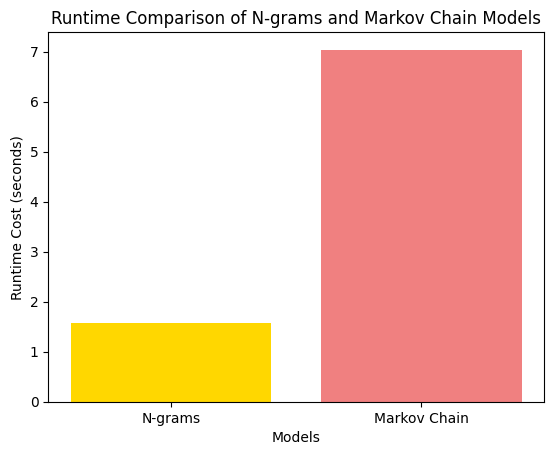

In [ ]:
# Bar chart visualisation of both model runtime cost in secounds et cetera.

# give the models a x label
models = ['N-grams', 'Markov Chain']

# define the runtime_costs as found above
runtime_costs = [n_grams_runtime_cost, markov_chain_runtime_cost]

# define the bar plot relationship between model and the runtime cost
plt.bar(models, runtime_costs, color=['gold', 'lightcoral'])

# Plot tweaks
plt.xlabel('Models') # x label
plt.ylabel('Runtime Cost (seconds)') # y label
plt.title('Runtime Comparison of N-grams and Markov Chain Models') # title

# Output the bar plot runtime cost
plt.show()

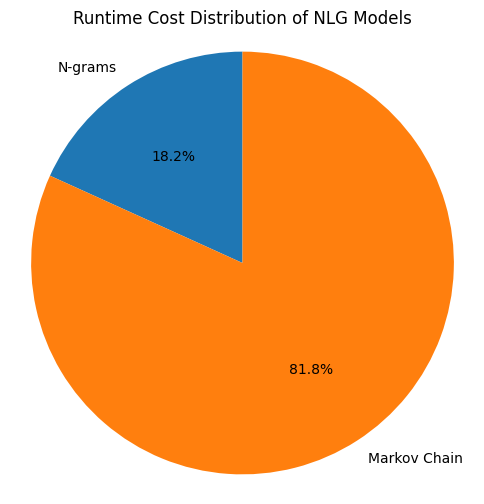

In [ ]:
# pie chart of our runtime costs of both models
models = ['N-grams', 'Markov Chain']  # define model names of both models
runtime_costs = [n_grams_runtime_cost, markov_chain_runtime_cost] # give the pie chart our computed, compeletd runtime cost values

# Create the pie chart of our runtime costs
plt.figure(figsize=(6, 6))  # figure size similiar to the above bar chart
plt.pie(runtime_costs, labels=models, autopct='%1.1f%%', startangle=90) # define that we want a pie chart and feed it our data and label names
plt.title('Runtime Cost Distribution of NLG Models') # give our pie chart a title
plt.axis('equal')  # ensure the pie chart has equal axis ratios to ensure it circual shape

# Show the pie chart of the runtime cost compared between both models
plt.show()

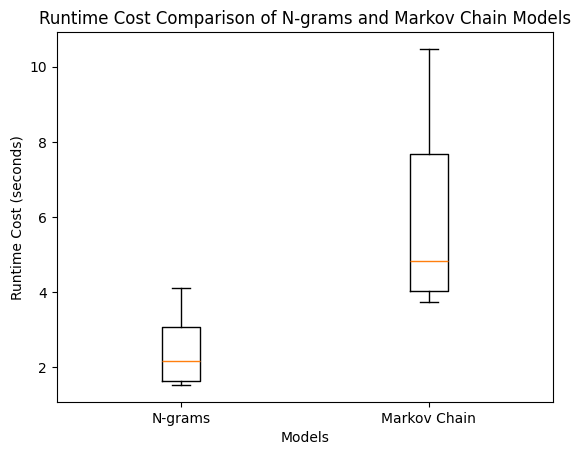

In [ ]:
# lets record the runtime cost in ten interations each for both modules, thus capturing a more accurate runtime metric as we are taking samples which will reduce the likelihood of outlayering data

# store the iterative runtime costs
ngrams_runtime_array = []
markov_chain_runtime_array = []

# record 10 times each for ngrmas
for _ in range(10):
  ngrams_runtime_array.append(runtime_cost(generate_text_ngrams, all_text, 3, 50))

# do the same for markov chains
for _ in range(10):
  markov_chain_runtime_array.append(runtime_cost(generate_text_markov, all_text, order=4, length=200, temperature=1.2))

# boxplot the recorded ten iterations
plt.boxplot([ngrams_runtime_array, markov_chain_runtime_array], labels=['N-grams', 'Markov Chain'], showfliers=False)
plt.xlabel('Models')
plt.ylabel('Runtime Cost (seconds)')
plt.title('Runtime Cost Comparison of N-grams and Markov Chain Models')

# output the boxplot
plt.show()

In [ ]:
# A function to determine the memory runtime cost of each of the NLG models I have used within this project.
def memory_cost(model, *args, **kwargs):
  # call the NLG model, either the ngrams or markov-chain model, use their given model arguments recursively
  model_call = lambda: model(*args, **kwargs)

  # define the memory usage by calling the model and husing the memory profiler function to do the dirty work for us and record the memory usage
  model_memory_usage = memory_usage((model_call, (), {}))

  # let's now get the max memory usage of each model and record it as the total memory usage of the model as run in our google collab enviroment
  highest_memory_used = max(model_memory_usage)

  # return the models memory cost (well, it's total memory cost as what is really wanted to be know if evaluating memory cost of anything normally.)
  return highest_memory_used

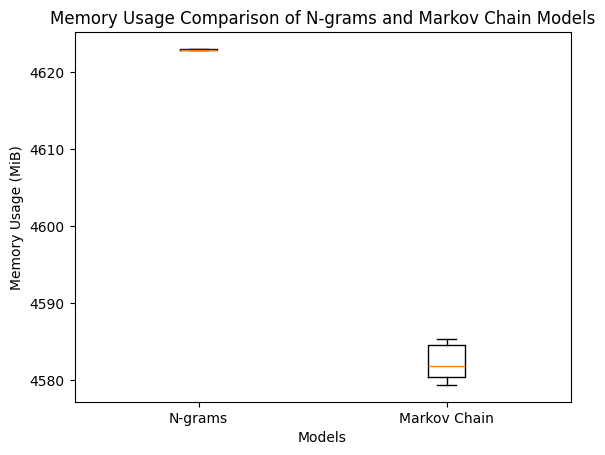

In [ ]:
# I will perform 10 iterations of recording the memory usage of both models to boxplot the averages/results of the memory cost

# For storing the iterations
n_grams_memory_array = []
markov_chain_memory_array = []

# Iterate 10 and record the memory cost of the n grams model
for _ in range(10):
  n_grams_memory_array.append(memory_cost(generate_text_ngrams, all_text, 3, 50))

# Iterate 10 times and recorde the memory cost of the markov chain models
for _ in range(10):
  markov_chain_memory_array.append(memory_cost(generate_text_markov, all_text, order=4, length=200, temperature=1.2))

# box plot based off the 10 iterations performed on both models above
plt.boxplot([n_grams_memory_array, markov_chain_memory_array], labels=['N-grams', 'Markov Chain'], showfliers=False)
plt.xlabel('Models')
plt.ylabel('Memory Usage (MiB)')
plt.title('Memory Usage Comparison of N-grams and Markov Chain Models')

# output the memory usage boxplot, ngrams tend to be more consistent hence the small ngrams box
plt.show()

In [ ]:
# Let's get the memory cost of each model.
n_grams_memory_cost = memory_cost(generate_text_ngrams, all_text, 3, 50)
markov_chain_memory_cost = memory_cost(generate_text_markov, all_text, order=4, length=200, temperature=1.2)

In [ ]:
# output memory cost of each model
print("N-grams memory cost:", int(n_grams_memory_cost), "MiB") # output the max memory cost of the ngrams model for our shakespeare project
print("Markov chain memory cost:", int(markov_chain_memory_cost), "MiB") # output the max memory cost of the markov chain model for our generate shakespeare text task project

N-grams memory cost: 4623 MiB
Markov chain memory cost: 4574 MiB


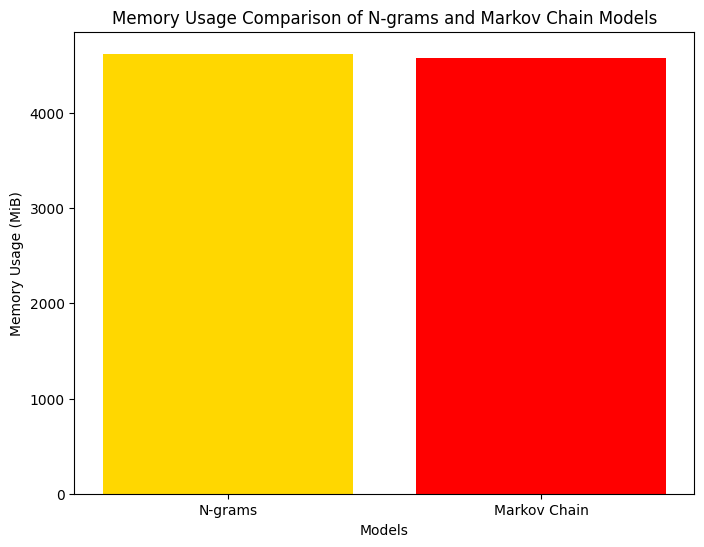

In [ ]:
# Define the memory usage bar chart plot

# Define and label the models
memory_usage = {
    'N-grams': n_grams_memory_cost, # for my ngrams model
    'Markov Chain': markov_chain_memory_cost # for my markov chain based model
}

# get the models based on the keys of the above dictionary
models = list(memory_usage.keys())

# get the cost of each model based on the model of each key of the dictionary defined previously
memory_costs = list(memory_usage.values())

# Create the bar plot
plt.figure(figsize=(8, 6)) # define the sizing of the model to be the same as same visualisations, namely 8 by 6
plt.bar(models, memory_costs, color=['gold', 'red']) # colour the models
plt.xlabel('Models') # set x label
plt.ylabel('Memory Usage (MiB)') # set y label
plt.title('Memory Usage Comparison of N-grams and Markov Chain Models') # set visualisation plot title

plt.show() # output the memory usage bar plot

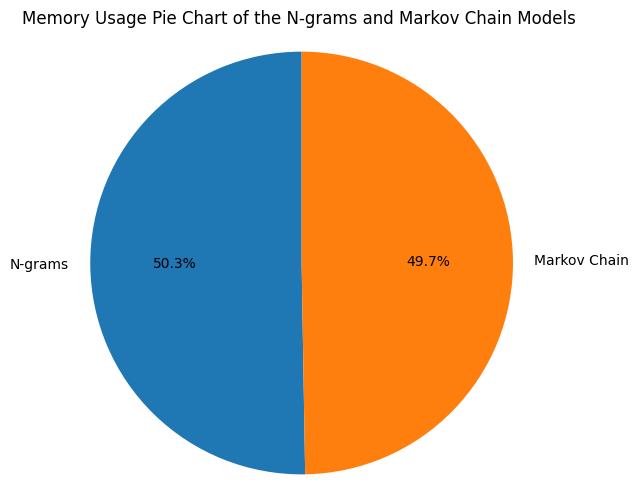

In [ ]:
# Pie chart visualisation of both models total memory cost

# define the objects in our pie chart namely both models
memory_usage = {
    'N-grams': int(n_grams_memory_cost), # define the ngrms model and give it the value of the memory cost
    'Markov Chain': int(markov_chain_memory_cost), # define the markov chain model and yet again giv ei tht memory cost of the markov chain model
}

# define labels and sizes
labels = list(memory_usage.keys()) # get the labels of th memory usage dictionary
sizes = list(memory_usage.values()) # get the costs of the memory usage dictionary

# create the memory usage pie chart
plt.figure(figsize=(6, 6)) # set the size of the pie chart, the same as previous visualisations for consistency and neatness
plt.pie(sizes, labels=labels, autopct='%1.1f%%', startangle=90) # define the pie chart, give it the memory costs and the labels reffering to each model
plt.axis('equal') # set the axies as equal to make sure it is a circle aka pie chart
plt.title('Memory Usage Pie Chart of the N-grams and Markov Chain Models ') # give our pie chart a title

plt.show() # output the pie chart showcasing the memory usage of each model as compare to one another

In [ ]:
# Compute the ratio's between the modules runtime and memory cost

# for runtime / memory cost ratio
runtime_memory_ratio_ngrams = n_grams_runtime_cost / n_grams_memory_cost # n-grams
runtime_memory_ratio_markov = markov_chain_runtime_cost / markov_chain_memory_cost # markov chain

# for memory cost / runtime cost ratio
memory_runtime_ratio_ngrams = n_grams_memory_cost / n_grams_runtime_cost # ngrams
memory_runtime_ratio_markov = markov_chain_memory_cost / markov_chain_runtime_cost # markov chain

# output the runtime cost / memory cost ratio(s)
print("N-grams Runtime/Memory Ratio:", runtime_memory_ratio_ngrams)
print("Markov Chain Runtime/Memory Ratio:", runtime_memory_ratio_markov) ; print('\n')

# output the memory cost / runtime cost ratio(s)
print("N-grams Memory/Runtime Ratio:", memory_runtime_ratio_ngrams)
print("Markov Chain Memory/Runtime Ratio:", memory_runtime_ratio_markov)

N-grams Runtime/Memory Ratio: 0.0003393232702607705
Markov Chain Runtime/Memory Ratio: 0.0015387139842794693


N-grams Memory/Runtime Ratio: 2947.04220913437
Markov Chain Memory/Runtime Ratio: 649.8933591405996


In [ ]:
# Function to return and calcuate the bleu score of a given model/pipeline
def calculate_bleu_score(reference, candidate):
  # Tokenize the reference and candidate texts
  reference_tokens = nltk.word_tokenize(reference) # define reference tokens
  candidate_tokens = nltk.word_tokenize(candidate) # define the candidate tokens/my 2 model tokens

  # remove the warnings from the bleu score output
  with warnings.catch_warnings():
      warnings.simplefilter("ignore") # ignore said warnings

      # Calculate the BLEU score
      bleu_score = nltk.translate.bleu_score.sentence_bleu([reference_tokens], candidate_tokens)

      # define the smoothie smoother
      smoothie = SmoothingFunction().method4
      bleu_score = nltk.translate.bleu_score.sentence_bleu([reference_tokens], candidate_tokens, smoothing_function=smoothie, weights=(0.25, 0.25, 0.25, 0.25))

      # return the calculated bleu score back
      return bleu_score

In [ ]:
# Ten iterations of BLEU score capture of both of my pipelined models

# To store the iterated score(s)
ngrams_corpus = []
markov_corpus = []

# For 10 iterations, generate shakespeare text for the models, so we can build up the results and compare with a reference corpus later, in the quest to capture the BLEU scores of both models
for _ in range(10):
  ngrams_corpus.append(generate_text_ngrams(all_text, 3, 10))
  markov_corpus.append(generate_text_markov(all_text, order=4, length=10, temperature=1.2))

# conjoin the scores
ngrams_corpus = " ".join(ngrams_corpus)
markov_corpus = " ".join(markov_corpus)

# compare to a reference corpus, Shakespeares actual lines
reference_corpus = " ".join(plays['PlayerLine'].sample(100).tolist())

# get the bleu scores
ngrams_bleu_corpus = calculate_bleu_score(reference_corpus, ngrams_corpus)
markov_bleu_corpus = calculate_bleu_score(reference_corpus, markov_corpus)

# Output the calculate BLEU scores for each model
print("N-grams Corpus BLEU score:", ngrams_bleu_corpus)
print("Markov chain Corpus BLEU score:", markov_bleu_corpus)

N-grams Corpus BLEU score: 2.8376370234300565e-05
Markov chain Corpus BLEU score: 6.378975922705855e-14


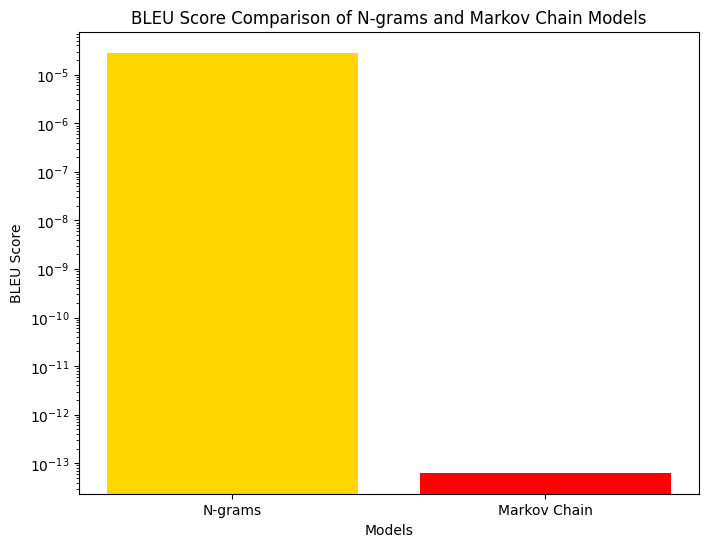

In [ ]:
# BLEU score model comparision bar plot

# set a dictionary containing the models and the relevant bleu scores
bleu_corpus = {
    'N-grams': ngrams_bleu_corpus,
    'Markov Chain': markov_bleu_corpus
}

# Annotation of my BLEU score bar plot
plt.figure(figsize=(8, 6))
plt.bar(bleu_corpus.keys(), bleu_corpus.values(), color=['gold', 'red'])
plt.xlabel('Models')
plt.ylabel('BLEU Score')
plt.yscale('log')
plt.title('BLEU Score Comparison of N-grams and Markov Chain Models')

# output bleu score comparison bar grapth
plt.show()

In [ ]:
# Function to return the rouge score, given a reference corpus text as-well as a candidate (evaulative corpus)
def get_rouge_scores(reference, candidate):
  # score for rouge-1, rouge-2, and rouge-l
  scorer = rouge_scorer.RougeScorer(['rouge1', 'rouge2', 'rougeL'], use_stemmer=True)

  # capture the rouge score(s)
  scores = scorer.score(reference, candidate)

  # return the rouge scores
  return scores

In [ ]:
# get rouge score of both models
ngrams_rouge_scores = get_rouge_scores(reference_corpus, ngrams_corpus) # for n grams pipeline
markov_rouge_scores = get_rouge_scores(reference_corpus, markov_corpus) # for markov chain piepline

# Output the capture ROUGE scores, will display a list as we are capturing the 3 scores
print("N-grams ROUGE scores:", ngrams_rouge_scores)
print("Markov chain ROUGE scores:", markov_rouge_scores)

N-grams ROUGE scores: {'rouge1': Score(precision=0.725, recall=0.1124031007751938, fmeasure=0.1946308724832215), 'rouge2': Score(precision=0.07563025210084033, recall=0.01164294954721863, fmeasure=0.020179372197309416), 'rougeL': Score(precision=0.3, recall=0.046511627906976744, fmeasure=0.08053691275167785)}
Markov chain ROUGE scores: {'rouge1': Score(precision=0.5588235294117647, recall=0.02454780361757106, fmeasure=0.04702970297029704), 'rouge2': Score(precision=0.030303030303030304, recall=0.00129366106080207, fmeasure=0.0024813895781637717), 'rougeL': Score(precision=0.4411764705882353, recall=0.01937984496124031, fmeasure=0.037128712871287134)}


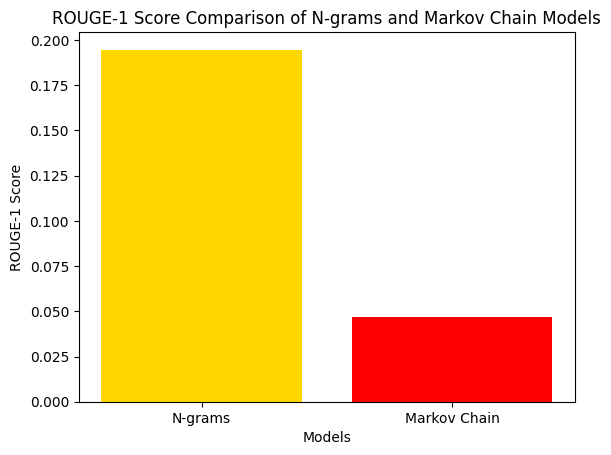

In [ ]:
# bar plot of each rouge score for each model
models = ['N-grams', 'Markov Chain']
rouge_scores = [ngrams_rouge_scores, markov_rouge_scores]

# Compute the rouge-1 scores for both models
rouge1_scores = [score['rouge1'].fmeasure for score in rouge_scores]

# Annotate the Rouge-1 scorer bar plot
plt.bar(models, rouge1_scores, color=['gold', 'red'])
plt.xlabel('Models')
plt.ylabel('ROUGE-1 Score')
plt.title('ROUGE-1 Score Comparison of N-grams and Markov Chain Models')

# output the ROUGE score bar chart
plt.show()

In [ ]:
# Meteor Evaluation function
def get_meteor_scores(reference, candidate):
    # get the reference tokens
    reference_tokens = nltk.word_tokenize(reference)

    # get the candidate(what we are actually going to evaluate tokens)
    candidate_tokens = nltk.word_tokenize(candidate)

    # perform the meteor scorer, actually get the meteor scores by using the above 2 parameters
    meteor_score_value = meteor_score([reference_tokens], candidate_tokens)

    # return the derived scores
    return meteor_score_value

In [ ]:
# get meteor scores of each model
ngrams_meteor_scores = get_meteor_scores(reference_corpus, ngrams_corpus)
markov_meteor_scores = get_meteor_scores(reference_corpus, markov_corpus)

# Output the METEOR scores of both models
print("N-grams METEOR scores:", ngrams_meteor_scores)
print("Markov chain METEOR scores:", markov_meteor_scores)

N-grams METEOR scores: 0.06242235585426248
Markov chain METEOR scores: 0.011316259678379988


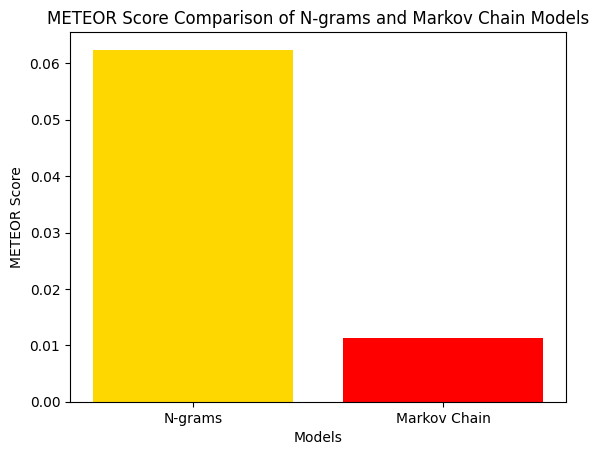

In [ ]:
# bar plot of meteor scores of each model
models = ['N-grams', 'Markov Chain']
scores = [ngrams_meteor_scores, markov_meteor_scores]

# Annotate the METEOR score bar-plot between both models
plt.bar(models, scores, color=['gold', 'red'])
plt.xlabel('Models')
plt.ylabel('METEOR Score')
plt.title('METEOR Score Comparison of N-grams and Markov Chain Models')

# Output the METEOR score plot
plt.show()

In [ ]:
 # Function to calculate Distinct N score of a given algorithm/model
def distinct_n(text, n):
  # get all the ngrams
  all_ngrams = list(ngrams(text.split(), n))

  # get the unqiue set of ngrams
  unique_ngrams = set(all_ngrams)

  # return the diff, aka how many chars are actually unique or distict N
  return len(unique_ngrams) / len(all_ngrams)

# Get Distinct N values of both models
n_grams_distinct_n_score = distinct_n(ngrams_output, 1)
markov_chain_distinct_n_score = distinct_n(markov_chain_output, 2)

# Output the distinct n scores
print("N-grams Distinct N score:", n_grams_distinct_n_score)
print("Markov Chain Distinct N score:", markov_chain_distinct_n_score)

N-grams Distinct N score: 0.7592592592592593
Markov Chain Distinct N score: 1.0


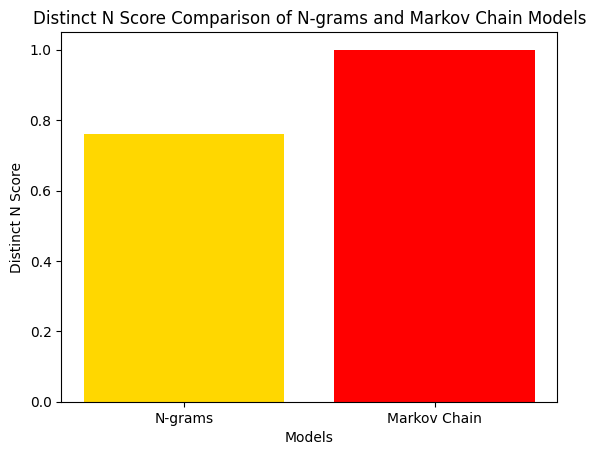

In [ ]:
# bar plot of the above distinct n scores
labels = ['N-grams', 'Markov Chain']
scores = [n_grams_distinct_n_score, markov_chain_distinct_n_score]

# annotate the distinct n visualisation
plt.bar(labels, scores, color=['gold', 'red'])
plt.xlabel('Models')
plt.ylabel('Distinct N Score')
plt.title('Distinct N Score Comparison of N-grams and Markov Chain Models')

# Outputs the Distinct N bar plot
plt.show()

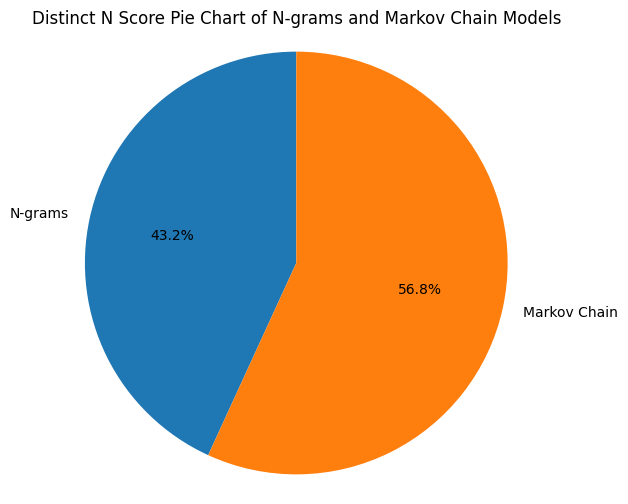

In [ ]:
# pie chart of the distinct n scores
labels = ['N-grams', 'Markov Chain']
scores = [n_grams_distinct_n_score, markov_chain_distinct_n_score]

# Annotation of the distinct n pie chart, complete with section labels and a title, as-well as a circular aspect ratio plus same size roughly as other section 4 graphs/charts.
plt.figure(figsize=(6, 6))
plt.pie(scores, labels=labels, autopct='%1.1f%%', startangle=90)
plt.axis('equal')
plt.title('Distinct N Score Pie Chart of N-grams and Markov Chain Models')

# Output the Distinct N in Pie Chart form.
plt.show()

In [ ]:
# Complete evaulation of ngrams model
ngrams_analysis = {
    'Runtime Cost': n_grams_runtime_cost,
    'Memory Cost': n_grams_memory_cost,
    'BLEU Score': ngrams_bleu_corpus,
    'ROUGE Score': ngrams_rouge_scores,
    'METEOR Score' : ngrams_meteor_scores,
    'Distinct N Score': n_grams_distinct_n_score
}

# Output the analysis for the ngrams model
ngrams_analysis

{'Runtime Cost': 1.5687484741210938,
 'Memory Cost': 4623.16796875,
 'BLEU Score': 2.8376370234300565e-05,
 'ROUGE Score': {'rouge1': Score(precision=0.725, recall=0.1124031007751938, fmeasure=0.1946308724832215),
  'rouge2': Score(precision=0.07563025210084033, recall=0.01164294954721863, fmeasure=0.020179372197309416),
  'rougeL': Score(precision=0.3, recall=0.046511627906976744, fmeasure=0.08053691275167785)},
 'METEOR Score': 0.06242235585426248,
 'Distinct N Score': 0.7592592592592593}

In [ ]:
# Analysis of the markov chain model
markov_analysis = {
    'Runtime Cost': markov_chain_runtime_cost,
    'Memory Cost': markov_chain_memory_cost,
    'BLEU Score': markov_bleu_corpus,
    'ROUGE Score': markov_rouge_scores,
    'METEOR Score' : markov_meteor_scores,
    'Distinct N Score': markov_chain_distinct_n_score
}

# Output the analysis from the markov chain model
markov_analysis

{'Runtime Cost': 7.038943290710449,
 'Memory Cost': 4574.5625,
 'BLEU Score': 6.378975922705855e-14,
 'ROUGE Score': {'rouge1': Score(precision=0.5588235294117647, recall=0.02454780361757106, fmeasure=0.04702970297029704),
  'rouge2': Score(precision=0.030303030303030304, recall=0.00129366106080207, fmeasure=0.0024813895781637717),
  'rougeL': Score(precision=0.4411764705882353, recall=0.01937984496124031, fmeasure=0.037128712871287134)},
 'METEOR Score': 0.011316259678379988,
 'Distinct N Score': 1.0}

In [ ]:
# add both the model analysis to a combined models dictionary
models = {
    'N-grams': ngrams_analysis, # the evaluative data for the ngrams pipeline
    'Markov Chain': markov_analysis # the evaluative data for the markov chain pipeline
}

# output the metrics of both models in the models dictionary
models # contains the evaluations of both pipelines/models/nlg algorithms

{'N-grams': {'Runtime Cost': 1.5687484741210938,
  'Memory Cost': 4623.16796875,
  'BLEU Score': 2.8376370234300565e-05,
  'ROUGE Score': {'rouge1': Score(precision=0.725, recall=0.1124031007751938, fmeasure=0.1946308724832215),
   'rouge2': Score(precision=0.07563025210084033, recall=0.01164294954721863, fmeasure=0.020179372197309416),
   'rougeL': Score(precision=0.3, recall=0.046511627906976744, fmeasure=0.08053691275167785)},
  'METEOR Score': 0.06242235585426248,
  'Distinct N Score': 0.7592592592592593},
 'Markov Chain': {'Runtime Cost': 7.038943290710449,
  'Memory Cost': 4574.5625,
  'BLEU Score': 6.378975922705855e-14,
  'ROUGE Score': {'rouge1': Score(precision=0.5588235294117647, recall=0.02454780361757106, fmeasure=0.04702970297029704),
   'rouge2': Score(precision=0.030303030303030304, recall=0.00129366106080207, fmeasure=0.0024813895781637717),
   'rougeL': Score(precision=0.4411764705882353, recall=0.01937984496124031, fmeasure=0.037128712871287134)},
  'METEOR Score': 0

In [ ]:
# convert models to a pandas dataframe
models_df = pd.DataFrame(models)

# save the models dataframe to a local csv file
models_df.to_csv('models.csv')

In [ ]:
# Construct Deltas based on model metrics, so we can easily see the diffs between evaluative metrics and help draw some conclusions based on the deltas and the visualisations created above.

# get delta of runtime cost
runtime_delta = markov_chain_runtime_cost - n_grams_runtime_cost

# get delta of memory cost
memory_delta = markov_chain_memory_cost - n_grams_memory_cost

# get delta of bleu score
bleu_delta = markov_bleu_corpus - ngrams_bleu_corpus

# get delta of Distinc-n score
distinct_n_delta = markov_chain_distinct_n_score - n_grams_distinct_n_score

# get delta of Rouge score
rouge_delta = markov_rouge_scores['rouge1'].fmeasure - ngrams_rouge_scores['rouge1'].fmeasure

# get delta of Meteor score
meteor_delta = markov_meteor_scores - ngrams_meteor_scores

# Output the delta's (I created these deltas in the form (markov chain - n gram))
print("Runtime Cost Delta:", round(runtime_delta, 2), "seconds") # runtime delta between both pipelines
print("Memory Cost Delta:", round(memory_delta, 2), "MiB") # memory cost delta between both models
print("BLEU Score Delta:", round(bleu_delta, 2)) # BLEU score delta between both pipelines
print("Distinct N Score Delta:", round(distinct_n_delta, 2)) # Distinct N Score between yet again both nlg model piplines
print("ROUGE Score Delta:", round(rouge_delta, 2)) # ROUGE, similiar to BLEU delta
print("METEOR Score Delta:", round(meteor_delta, 2)) # METEOR, a scoring metric similiar to BLEU and ROUGE in purpose

Runtime Cost Delta: 5.47 seconds
Memory Cost Delta: -48.61 MiB
BLEU Score Delta: -0.0
Distinct N Score Delta: 0.24
ROUGE Score Delta: -0.15
METEOR Score Delta: -0.05


In [ ]:
# For the last time, I will display all the metrics recorded for both modules as further confirmation of the results and to make the conclusions drawn below.
pprint.pprint(models)

{'Markov Chain': {'BLEU Score': 6.378975922705855e-14,
                  'Distinct N Score': 1.0,
                  'METEOR Score': 0.011316259678379988,
                  'Memory Cost': 4574.5625,
                  'ROUGE Score': {'rouge1': Score(precision=0.5588235294117647, recall=0.02454780361757106, fmeasure=0.04702970297029704),
                                  'rouge2': Score(precision=0.030303030303030304, recall=0.00129366106080207, fmeasure=0.0024813895781637717),
                                  'rougeL': Score(precision=0.4411764705882353, recall=0.01937984496124031, fmeasure=0.037128712871287134)},
                  'Runtime Cost': 7.038943290710449},
 'N-grams': {'BLEU Score': 2.8376370234300565e-05,
             'Distinct N Score': 0.7592592592592593,
             'METEOR Score': 0.06242235585426248,
             'Memory Cost': 4623.16796875,
             'ROUGE Score': {'rouge1': Score(precision=0.725, recall=0.1124031007751938, fmeasure=0.1946308724832215),
         

#### **Analysis and Conclusions**
From the above results we can assert that the models share similiar memory and runtime usages, but the n-grams model performs better on a NLG footing as seen by the significantly-higher BLEU, ROUGE and METEOR scores comparative to the markov chain model which means that is has higher quality text than markov. However Markov Chain creates more distinct/unique text as seen by the higher Distinct N score however suffers from usually-larger runtime-costs.

However by using intrinsic human evaluation, by looking at the outputs of both NLG pipelines we can suggest while they do output Shake-speare like text, we would need to use more advanced models such as a Transformer-based Model to really capture the corpus-context.